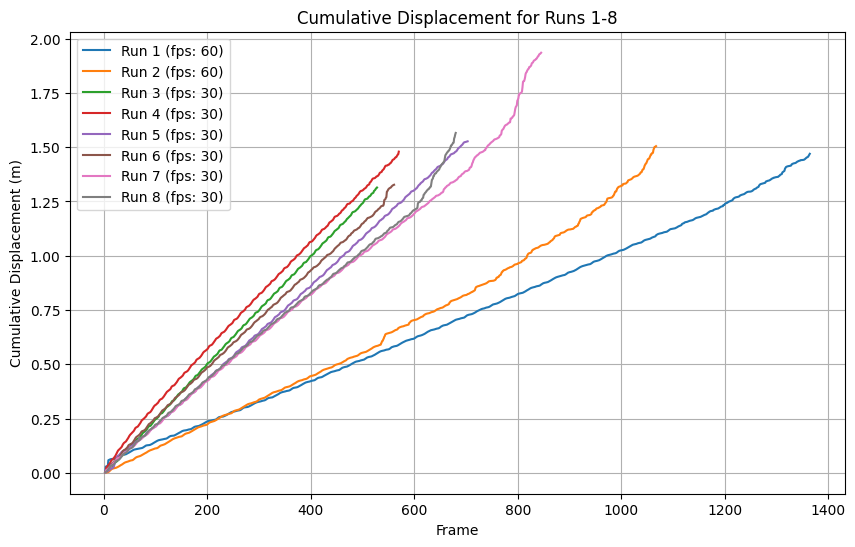

In [19]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate total displacement from a CSV file
def calculate_total_displacement(file_path, fps, x_length_meters=0.5625, y_length_meters=1):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers
    columns = df.iloc[1].tolist()  # Get the header row
    coordinate_columns = [i for i, val in enumerate(columns) if val in ['x', 'y']]  # Only select x and y

    # Extract relevant x, y coordinates into a new dataframe, skipping the first two rows
    coordinates_df = df.iloc[2:, coordinate_columns[:44]].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate displacement between frames (difference between consecutive frames)
    displacement_x = x_coords.diff().mean(axis=1)  # Mean x displacement across markers
    displacement_y = y_coords.diff().mean(axis=1)  # Mean y displacement across markers

    # Calculate total displacement
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2)

    # Calculate cumulative displacement over time
    cumulative_displacement = total_displacement.cumsum()

    return cumulative_displacement

# List of file paths for runs 1 to 8 and corresponding fps
file_paths = [
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run1DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 60),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run2DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 60),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 30),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run4DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 30),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run5DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 30),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run6DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 30),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run7DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 30),
    ('/Users/jamesxu/Downloads/test_40cm/40cm_run8DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv', 30)
]

# Calculate the cumulative displacements for each run with the appropriate fps
cumulative_displacements = [calculate_total_displacement(file_path, fps) for file_path, fps in file_paths]

# Plotting the displacements for each run
plt.figure(figsize=(10, 6))

for i, displacement in enumerate(cumulative_displacements):
    plt.plot(displacement, label=f'Run {i + 1} (fps: {file_paths[i][1]})')

plt.title('Cumulative Displacement for Runs 1-8')
plt.xlabel('Frame')
plt.ylabel('Cumulative Displacement (m)')
plt.grid(True)
plt.legend()
plt.show()


[0.62609258 0.63331959 0.45699182 0.51616834 0.60255541 0.51327442
 0.78863678 0.62196728]


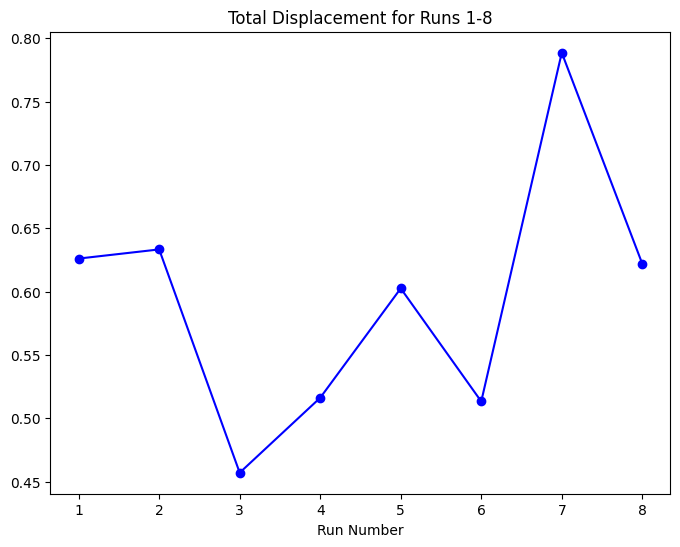

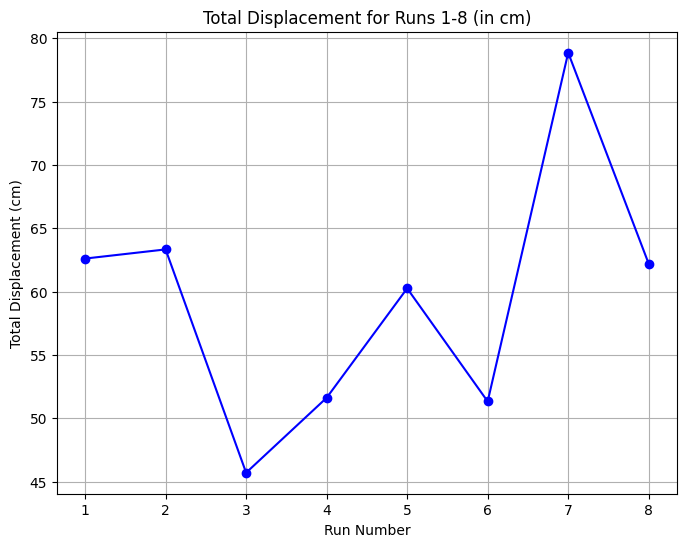

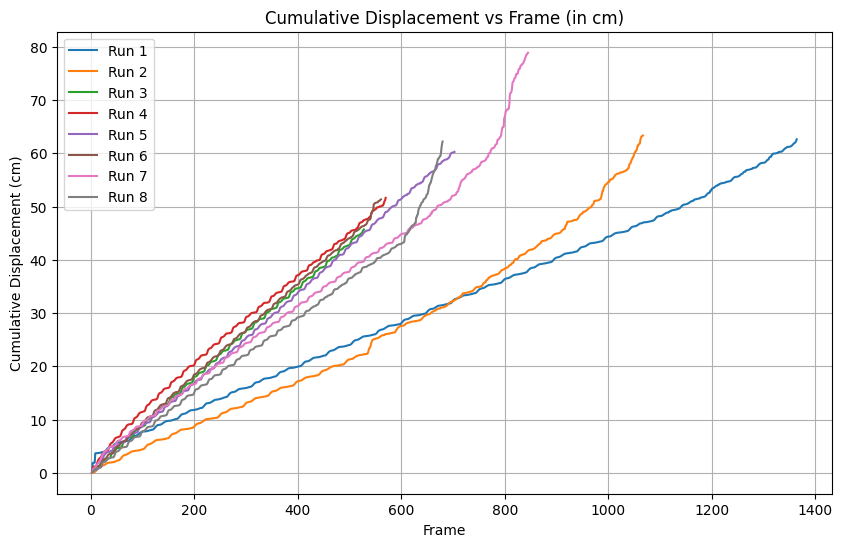

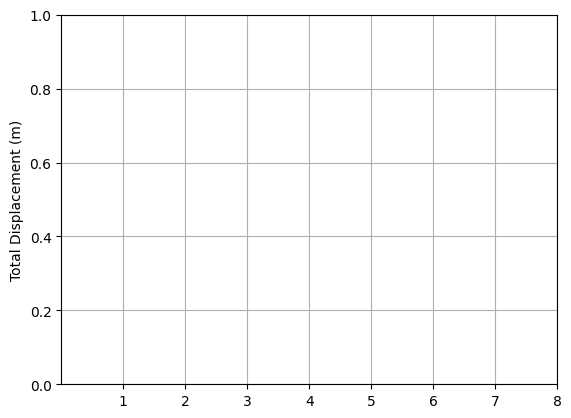

In [24]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate total displacement from a CSV file with normalization
def calculate_total_displacement(file_path, x_length_meters=0.5625, y_length_meters=1):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates and normalize them
    x_coords = df.iloc[2:, ::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_x
    y_coords = df.iloc[2:, 1::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_y

    # Calculate displacement between frames (difference between consecutive frames)
    displacement_x = x_coords.diff().mean(axis=1)
    displacement_y = y_coords.diff().mean(axis=1)

    # Calculate total displacement and sum it for the entire run
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2).sum()

    return total_displacement

# List of file paths for runs 1 to 8
file_paths = [
    '/Users/jamesxu/Downloads/test_40cm/40cm_run1DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run2DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run4DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run5DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run6DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run7DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run8DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
]

# Calculate the total displacements for each run
displacements = np.array([calculate_total_displacement(file_path) for file_path in file_paths])

# Print the displacement array
print(displacements)

# Plotting the displacements for each run
plt.figure(figsize=(8, 6))
plt.plot(range(1, 9), displacements, marker='o', linestyle='-', color='b')
plt.title('Total Displacement for Runs 1-8')
plt.xlabel('Run Number')# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate total and cumulative displacement from a CSV file with normalization
def calculate_total_and_cumulative_displacement(file_path, x_length_meters=0.5625, y_length_meters=1):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates and normalize them
    x_coords = df.iloc[2:, ::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_x
    y_coords = df.iloc[2:, 1::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_y

    # Calculate displacement between frames (difference between consecutive frames)
    displacement_x = x_coords.diff().mean(axis=1)
    displacement_y = y_coords.diff().mean(axis=1)

    # Calculate total displacement and cumulative displacement
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2)
    cumulative_displacement = total_displacement.cumsum()

    return total_displacement.sum(), cumulative_displacement

# List of file paths for runs 1 to 8
file_paths = [
    '/Users/jamesxu/Downloads/test_40cm/40cm_run1DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run2DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run4DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run5DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run6DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run7DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv',
    '/Users/jamesxu/Downloads/test_40cm/40cm_run8DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
]

# Calculate the total displacements and cumulative displacements for each run
displacements = []
cumulative_displacements = []

for file_path in file_paths:
    total_disp, cumulative_disp = calculate_total_and_cumulative_displacement(file_path)
    displacements.append(total_disp * 100)  # Convert to cm
    cumulative_displacements.append(cumulative_disp * 100)  # Convert to cm

# Plotting the total displacement for each run in cm (Figure 1)
plt.figure(figsize=(8, 6))
plt.plot(range(1, 9), displacements, marker='o', linestyle='-', color='b')
plt.title('Total Displacement for Runs 1-8 (in cm)')
plt.xlabel('Run Number')
plt.ylabel('Total Displacement (cm)')
plt.grid(True)
plt.xticks(range(1, 9))  # Set x-ticks for each run number
plt.show()

# Plotting the cumulative displacement vs frame for each run (Figure 2)
plt.figure(figsize=(10, 6))

for i, cumulative_disp in enumerate(cumulative_displacements):
    plt.plot(cumulative_disp, label=f'Run {i + 1}')

plt.title('Cumulative Displacement vs Frame (in cm)')
plt.xlabel('Frame')
plt.ylabel('Cumulative Displacement (cm)')
plt.grid(True)
plt.legend()
plt.show()

plt.ylabel('Total Displacement (m)')
plt.grid(True)
plt.xticks(range(1, 9))  # Set x-ticks for each run number
plt.show()


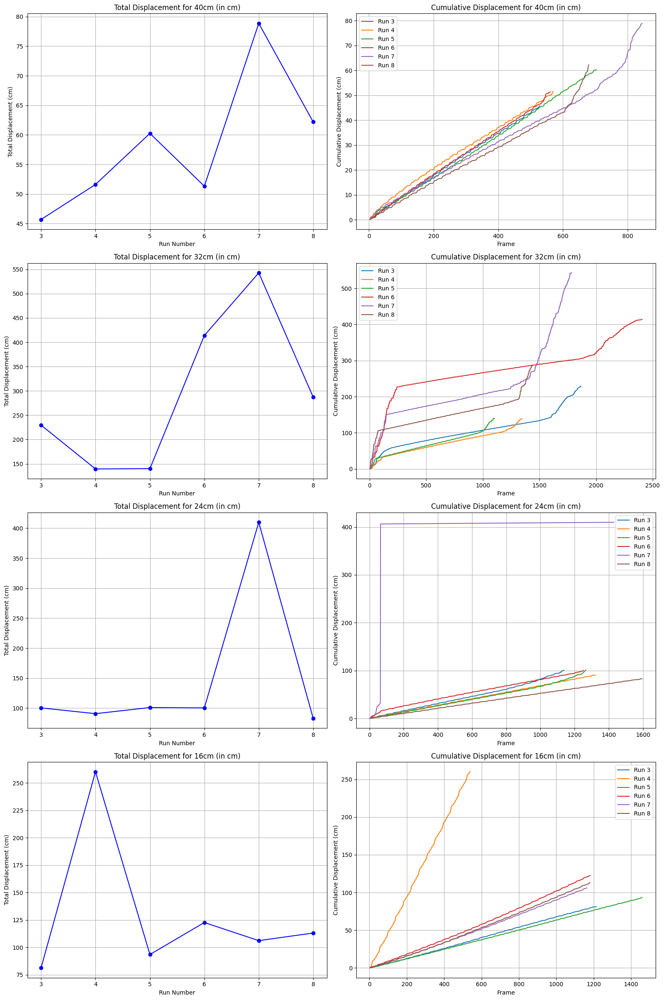

In [30]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate total and cumulative displacement from a CSV file with normalization
def calculate_total_and_cumulative_displacement(file_path, x_length_meters=0.5625, y_length_meters=1):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates and normalize them
    x_coords = df.iloc[2:, ::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_x
    y_coords = df.iloc[2:, 1::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_y

    # Calculate displacement between frames (difference between consecutive frames)
    displacement_x = x_coords.diff().mean(axis=1)
    displacement_y = y_coords.diff().mean(axis=1)

    # Calculate total displacement and cumulative displacement
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2)
    cumulative_displacement = total_displacement.cumsum()

    return total_displacement.sum(), cumulative_displacement

# Define the four datasets and runs to be analyzed
data_sets = ['40cm', '32cm', '24cm', '16cm']
runs = ['run3', 'run4', 'run5', 'run6', 'run7', 'run8']

# List of file paths for each dataset and run based on exact names in the screenshot
file_paths = {
    '40cm': [f'/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_{run}DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv' for run in runs],
    '32cm': [f'/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_{run}DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv' for run in runs],
    '24cm': [f'/Users/jamesxu/Downloads/diffLength_filtered_data_csv/24cm_{run}DLC_resnet50_24cm_newOct2shuffle1_100000_filtered.csv' for run in runs],
    '16cm': [f'/Users/jamesxu/Downloads/diffLength_filtered_data_csv/16cm_{run}DLC_resnet50_16cm_newOct3shuffle1_100000_filtered.csv' for run in runs]
}

# Create figure with 8 subplots (4x2 grid)
fig, axes = plt.subplots(4, 2, figsize=(16, 24))

# Loop through each dataset and calculate displacements
for i, dataset in enumerate(data_sets):
    displacements = []
    cumulative_displacements = []

    for file_path in file_paths[dataset]:
        total_disp, cumulative_disp = calculate_total_and_cumulative_displacement(file_path)
        displacements.append(total_disp * 100)  # Convert to cm
        cumulative_displacements.append(cumulative_disp * 100)  # Convert to cm

    # Top plot for total displacement
    ax_total_disp = axes[i, 0]
    ax_total_disp.plot(range(3, 9), displacements, marker='o', linestyle='-', color='b')
    ax_total_disp.set_title(f'Total Displacement for {dataset} (in cm)')
    ax_total_disp.set_xlabel('Run Number')
    ax_total_disp.set_ylabel('Total Displacement (cm)')
    ax_total_disp.grid(True)
    ax_total_disp.set_xticks(range(3, 9))  # Set x-ticks for run numbers

    # Bottom plot for cumulative displacement vs frame
    ax_cumulative_disp = axes[i, 1]
    for j, cumulative_disp in enumerate(cumulative_displacements):
        ax_cumulative_disp.plot(cumulative_disp, label=f'Run {j + 3}')
    ax_cumulative_disp.set_title(f'Cumulative Displacement for {dataset} (in cm)')
    ax_cumulative_disp.set_xlabel('Frame')
    ax_cumulative_disp.set_ylabel('Cumulative Displacement (cm)')
    ax_cumulative_disp.grid(True)
    ax_cumulative_disp.legend()

# Adjust layout
plt.tight_layout()
plt.show()


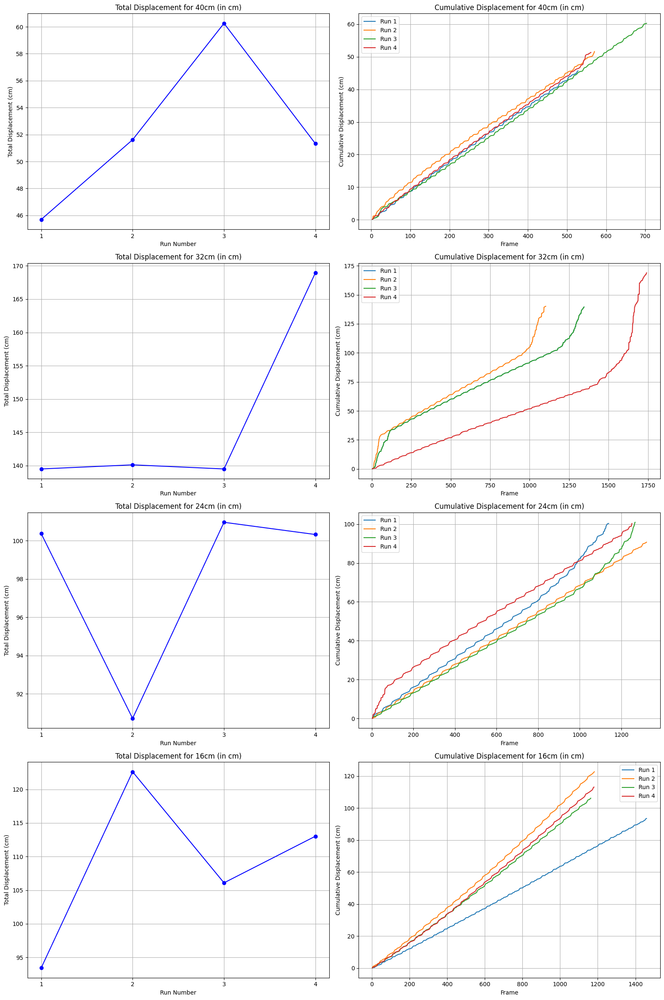

40cm Displacements (in cm):
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv: 45.70 cm
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run4DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv: 51.62 cm
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run5DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv: 60.26 cm
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run6DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv: 51.33 cm
32cm Displacements (in cm):
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run4DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv: 139.49 cm
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run5DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv: 140.11 cm
/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run4DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv: 139.49 cm
/Users/jamesxu/Downloads/diffLength_filtered_data_cs

In [39]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate total and cumulative displacement from a CSV file with normalization
def calculate_total_and_cumulative_displacement(file_path, x_length_meters=0.5625, y_length_meters=1):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates and normalize them
    x_coords = df.iloc[2:, ::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_x
    y_coords = df.iloc[2:, 1::2].apply(pd.to_numeric, errors='coerce') * normalization_factor_y

    # Calculate displacement between frames (difference between consecutive frames)
    displacement_x = x_coords.diff().mean(axis=1)
    displacement_y = y_coords.diff().mean(axis=1)

    # Calculate total displacement and cumulative displacement
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2)
    cumulative_displacement = total_displacement.cumsum()

    return total_displacement.sum(), cumulative_displacement

# Data loading - 16 explicit lines for each run
file_40cm_run2 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
file_40cm_run3 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run4DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
file_40cm_run4 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run5DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
file_40cm_run5 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/40cm_run6DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'

file_32cm_run3 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run4DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv'
file_32cm_run4 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run5DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv'
file_32cm_run5 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run4DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv'
file_32cm_run8 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/32cm_run2DLC_resnet50_32cm_newOct2shuffle1_100000_filtered.csv'

file_24cm_run3 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/24cm_run3DLC_resnet50_24cm_newOct2shuffle1_100000_filtered.csv'
file_24cm_run4 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/24cm_run4DLC_resnet50_24cm_newOct2shuffle1_100000_filtered.csv'
file_24cm_run5 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/24cm_run5DLC_resnet50_24cm_newOct2shuffle1_100000_filtered.csv'
file_24cm_run6 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/24cm_run6DLC_resnet50_24cm_newOct2shuffle1_100000_filtered.csv'

file_16cm_run5 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/16cm_run5DLC_resnet50_16cm_newOct3shuffle1_100000_filtered.csv'
file_16cm_run6 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/16cm_run6DLC_resnet50_16cm_newOct3shuffle1_100000_filtered.csv'
file_16cm_run7 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/16cm_run7DLC_resnet50_16cm_newOct3shuffle1_100000_filtered.csv'
file_16cm_run8 = '/Users/jamesxu/Downloads/diffLength_filtered_data_csv/16cm_run8DLC_resnet50_16cm_newOct3shuffle1_100000_filtered.csv'

# Create figure with 8 subplots (4x2 grid)
fig, axes = plt.subplots(4, 2, figsize=(16, 24))

# Total displacement and cumulative displacement arrays for each length
files_40cm = [file_40cm_run2, file_40cm_run3, file_40cm_run4, file_40cm_run5]
files_32cm = [file_32cm_run3, file_32cm_run4, file_32cm_run5, file_32cm_run8]
files_24cm = [file_24cm_run3, file_24cm_run4, file_24cm_run5, file_24cm_run6]
files_16cm = [file_16cm_run5, file_16cm_run6, file_16cm_run7, file_16cm_run8]

# Create a dictionary to map data to plots
datasets = {
    '40cm': files_40cm,
    '32cm': files_32cm,
    '24cm': files_24cm,
    '16cm': files_16cm
}

# Loop through each dataset and calculate displacements
for i, (dataset, files) in enumerate(datasets.items()):
    displacements = []
    cumulative_displacements = []

    for file_path in files:
        total_disp, cumulative_disp = calculate_total_and_cumulative_displacement(file_path)
        displacements.append(total_disp * 100)  # Convert to cm
        cumulative_displacements.append(cumulative_disp * 100)  # Convert to cm

    # Top plot for total displacement
    ax_total_disp = axes[i, 0]
    ax_total_disp.plot(range(1, 5), displacements, marker='o', linestyle='-', color='b')
    ax_total_disp.set_title(f'Total Displacement for {dataset} (in cm)')
    ax_total_disp.set_xlabel('Run Number')
    ax_total_disp.set_ylabel('Total Displacement (cm)')
    ax_total_disp.grid(True)
    ax_total_disp.set_xticks(range(1, 5))  # Set x-ticks for run numbers

    # Bottom plot for cumulative displacement vs frame
    ax_cumulative_disp = axes[i, 1]
    for j, cumulative_disp in enumerate(cumulative_displacements):
        ax_cumulative_disp.plot(cumulative_disp, label=f'Run {j + 1}')
    ax_cumulative_disp.set_title(f'Cumulative Displacement for {dataset} (in cm)')
    ax_cumulative_disp.set_xlabel('Frame')
    ax_cumulative_disp.set_ylabel('Cumulative Displacement (cm)')
    ax_cumulative_disp.grid(True)
    ax_cumulative_disp.legend()

# Adjust layout
plt.tight_layout()
plt.show()


# Print total displacement for each run
for dataset, files in datasets.items():
    print(f"{dataset} Displacements (in cm):")
    for file_path in files:
        total_disp, _ = calculate_total_and_cumulative_displacement(file_path)
        print(f'{file_path}: {total_disp * 100:.2f} cm')


/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_43836/2690887057.py:47: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "ro-" (-> linestyle='-'). The keyword argument will take precedence.
  ax1.errorbar(lengths, velocity_means, yerr=velocity_std, fmt='ro-', label='Velocity (cm/s)', markersize=8, linestyle='--', linewidth=1)
/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_43836/2690887057.py:55: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "bo-" (-> linestyle='-'). The keyword argument will take precedence.
  ax2.errorbar(lengths, disp_means, yerr=disp_std, fmt='bo-', label='Disp (BL/cycle)', markersize=8, linestyle='--', linewidth=1)


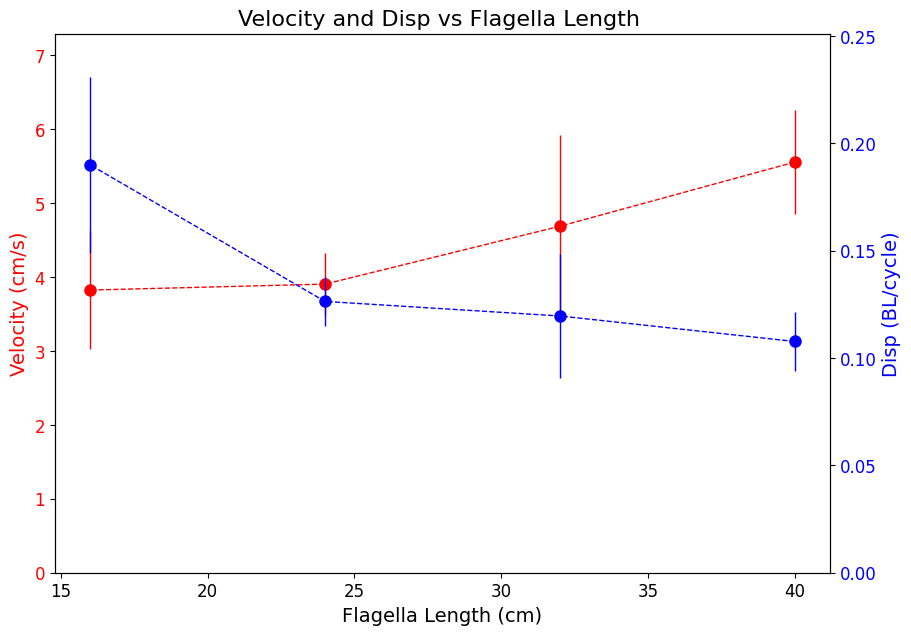

/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_43836/2690887057.py:67: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "go-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.errorbar(lengths, temp_freq_means, yerr=temp_freq_std, fmt='go-', label='Temporal Frequency (Hz)', markersize=8, linestyle='--', linewidth=1)


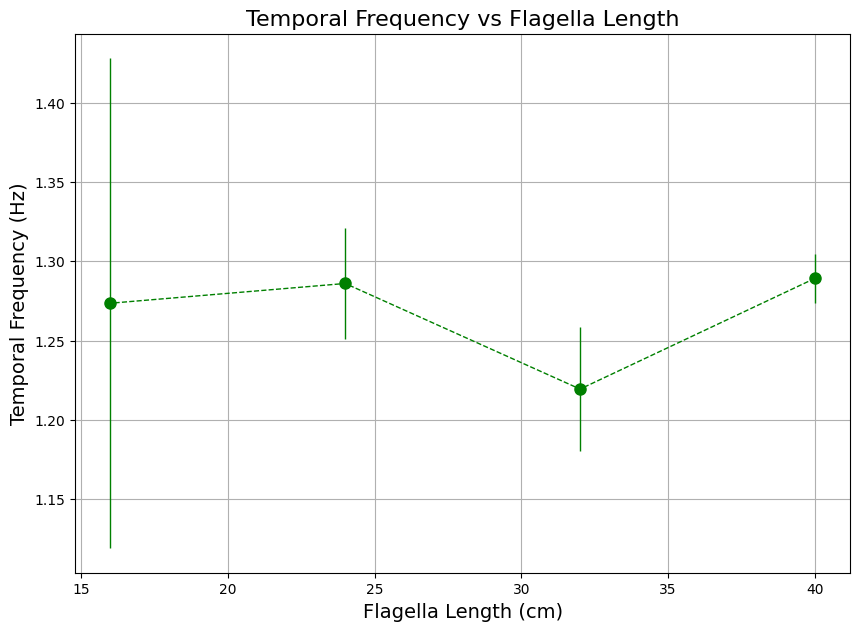

In [44]:
import numpy as np
import matplotlib.pyplot as plt

# Data for four runs each length
lengths = [40, 32, 24, 16]

# Velocity data (mean for 4 runs), normalized by *0.8
velocity_data = {
    40: [6.855 * 0.8, 7.287529412 * 0.8, 8.034666667 * 0.8, 5.599636364 * 0.8],
    32: [6.340454545 * 0.8, 7.783888889 * 0.8, 3.48725 * 0.8, 5.825862069 * 0.8],
    24: [5.576111111 * 0.8, 4.123636364 * 0.8, 4.807619048 * 0.8, 5.016 * 0.8],
    16: [3.893333333 * 0.8, 3.695263158 * 0.8, 5.583684211 * 0.8, 5.948947368 * 0.8]
}

# Displacement (BL/cycle) data (mean for 4 runs), normalized by *0.8
disp_bl_data = {
    40: [0.130571429 * 0.8, 0.140781818 * 0.8, 0.1572 * 0.8, 0.109992857 * 0.8],
    32: [0.161446759 * 0.8, 0.190366848 * 0.8, 0.090813802 * 0.8, 0.155284926 * 0.8],
    24: [0.174253472 * 0.8, 0.135 * 0.8, 0.161794872 * 0.8, 0.160769231 * 0.8],
    16: [0.2336 * 0.8, 0.15671875 * 0.8, 0.265225 * 0.8, 0.294348958 * 0.8]
}

# Temporal frequency data
temp_freq_data = {
    40: [1.3125, 1.294117647, 1.277777778, 1.272727273],
    32: [1.227272727, 1.277777778, 1.2, 1.172413793],
    24: [1.333333333, 1.272727273, 1.238095238, 1.3],
    16: [1.041666667, 1.473684211, 1.315789474, 1.263157895]
}

# Calculate mean and standard deviation for each flagella length
velocity_means = [np.mean(velocity_data[length]) for length in lengths]
velocity_std = [np.std(velocity_data[length]) for length in lengths]

disp_means = [np.mean(disp_bl_data[length]) for length in lengths]
disp_std = [np.std(disp_bl_data[length]) for length in lengths]

temp_freq_means = [np.mean(temp_freq_data[length]) for length in lengths]
temp_freq_std = [np.std(temp_freq_data[length]) for length in lengths]

# Create the plot with two y-axes for velocity and displacement
fig, ax1 = plt.subplots(figsize=(10, 7))

# Plotting velocity with error bars on the left y-axis
ax1.set_xlabel('Flagella Length (cm)', fontsize=14)
ax1.set_ylabel('Velocity (cm/s)', color='r', fontsize=14)
ax1.errorbar(lengths, velocity_means, yerr=velocity_std, fmt='ro-', label='Velocity (cm/s)', markersize=8, linestyle='--', linewidth=1)
ax1.tick_params(axis='y', labelcolor='r', labelsize=12)
ax1.set_ylim(0, max(velocity_means) + max(velocity_std) + 0.5)  # Adjust y-axis to start from 0
ax1.tick_params(axis='x', labelsize=12)

# Create a second y-axis for displacement
ax2 = ax1.twinx()
ax2.set_ylabel('Disp (BL/cycle)', color='b', fontsize=14)
ax2.errorbar(lengths, disp_means, yerr=disp_std, fmt='bo-', label='Disp (BL/cycle)', markersize=8, linestyle='--', linewidth=1)
ax2.tick_params(axis='y', labelcolor='b', labelsize=12)
ax2.set_ylim(0, max(disp_means) + max(disp_std) + 0.02)  # Adjust y-axis to start from 0

# Set title
plt.title('Velocity and Disp vs Flagella Length ', fontsize=16)

# Display the plot
plt.show()

# Plotting the temporal frequency with error bars
plt.figure(figsize=(10, 7))
plt.errorbar(lengths, temp_freq_means, yerr=temp_freq_std, fmt='go-', label='Temporal Frequency (Hz)', markersize=8, linestyle='--', linewidth=1)
plt.xlabel('Flagella Length (cm)', fontsize=14)
plt.ylabel('Temporal Frequency (Hz)', fontsize=14)
plt.title('Temporal Frequency vs Flagella Length', fontsize=16)
plt.grid(True)
plt.show()


/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_43836/261996786.py:42: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "ro-" (-> linestyle='-'). The keyword argument will take precedence.
  ax1.plot(lengths, velocity_means, 'ro-', label='Velocity (cm/s)', markersize=8, linestyle='-', linewidth=1)
/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_43836/261996786.py:43: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "r--" (-> linestyle='--'). The keyword argument will take precedence.
  ax1.plot(lengths, temp_freq_means, 'r--', label='Temporal Frequency (Hz)', markersize=8, linestyle='--', linewidth=1)
/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_43836/261996786.py:51: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "bo-" (-> linestyle='-'). The keyword argument will take precedence.
  ax2.plot(le

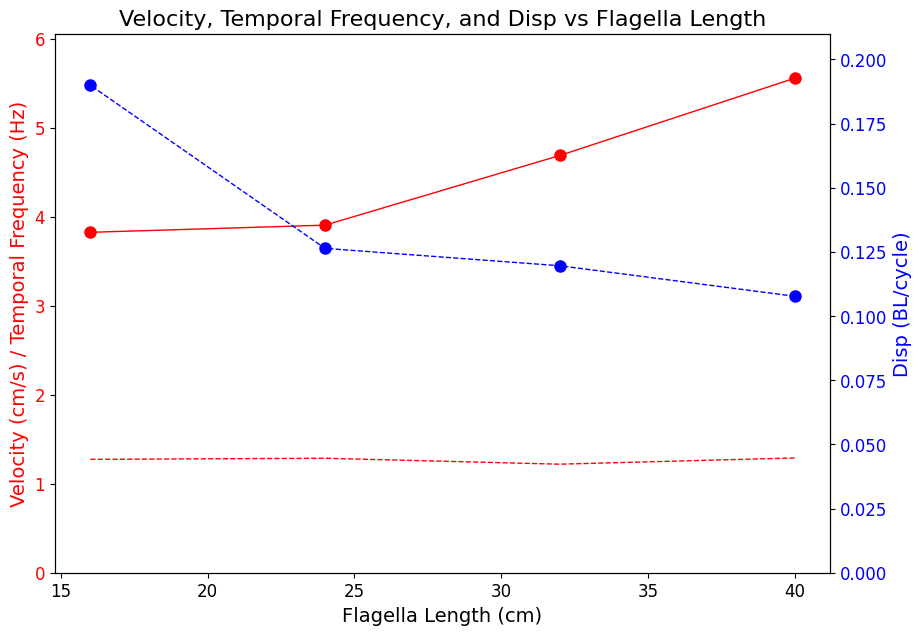

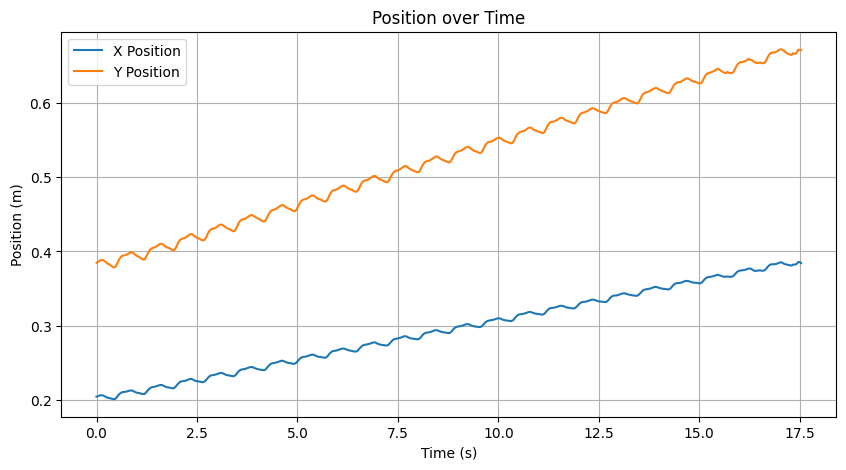

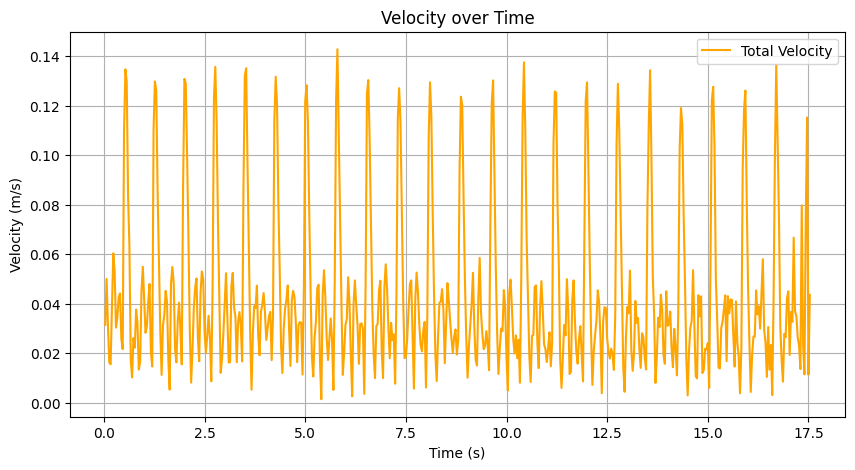

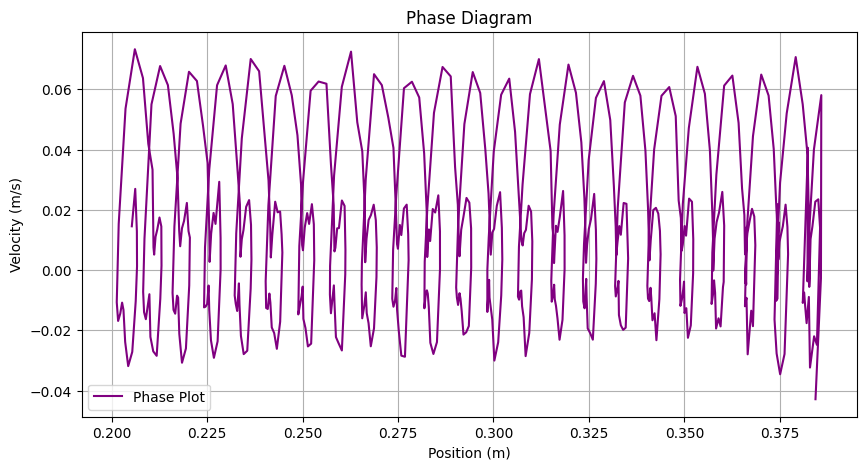

In [51]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to process the data and perform plotting
def analyze_and_plot(file_path, x_length_meters=0.5625, y_length_meters=1, fps=30):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers, skipping the first two rows
    coordinates_df = df.iloc[2:, :44].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate mean position over markers
    mean_x_position = x_coords.mean(axis=1)
    mean_y_position = y_coords.mean(axis=1)
    
    # Calculate velocity (numerical derivative)
    velocity_x = mean_x_position.diff() * fps
    velocity_y = mean_y_position.diff() * fps
    total_velocity = np.sqrt(velocity_x**2 + velocity_y**2)

    # Plot position over time
    time = np.arange(len(mean_x_position)) / fps
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position, label='X Position')
    plt.plot(time, mean_y_position, label='Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time[1:], total_velocity[1:], label='Total Velocity', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot phase diagram (position vs. velocity)
    plt.figure(figsize=(10, 5))
    plt.plot(mean_x_position[1:], velocity_x[1:], label='Phase Plot', color='purple')
    plt.xlabel('Position (m)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Phase Diagram')
    plt.legend()
    plt.grid(True)
    plt.show()

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'

# Run the function
analyze_and_plot(file_path)


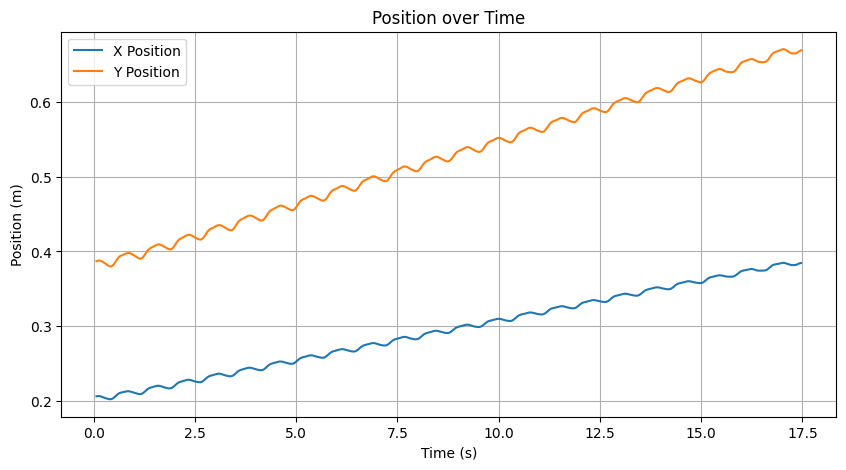

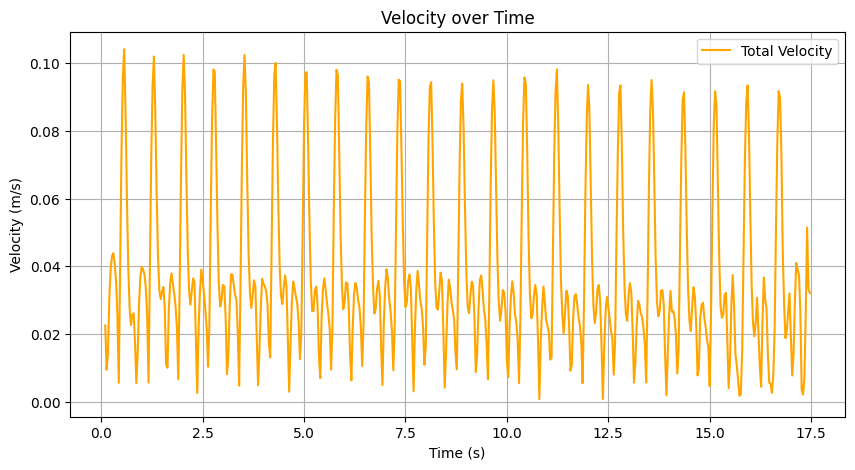

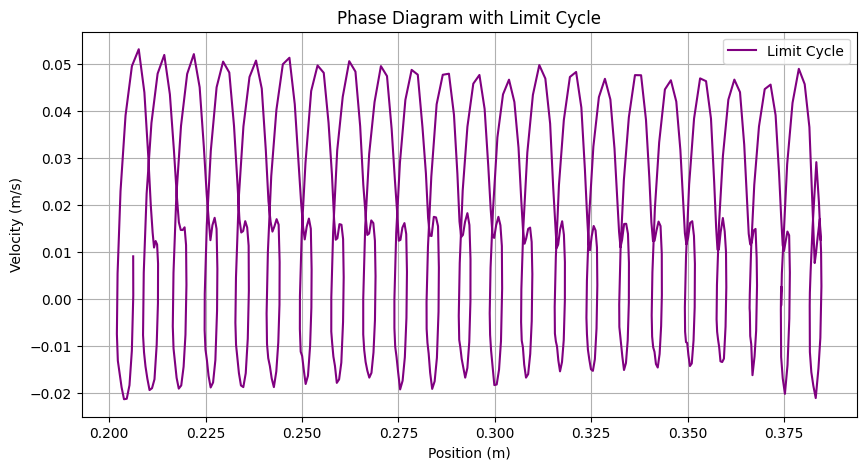

In [52]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to process the data and perform plotting
def analyze_and_plot_with_smoothing(file_path, x_length_meters=0.5625, y_length_meters=1, fps=30, smooth_window=5):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers, skipping the first two rows
    coordinates_df = df.iloc[2:, :44].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate mean position over markers and smooth the data
    mean_x_position = smooth_data(x_coords.mean(axis=1), window_size=smooth_window)
    mean_y_position = smooth_data(y_coords.mean(axis=1), window_size=smooth_window)
    
    # Calculate velocity (numerical derivative) after smoothing
    velocity_x = mean_x_position.diff() * fps
    velocity_y = mean_y_position.diff() * fps
    total_velocity = np.sqrt(velocity_x**2 + velocity_y**2)

    # Plot position over time
    time = np.arange(len(mean_x_position)) / fps
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position, label='X Position')
    plt.plot(time, mean_y_position, label='Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time[1:], total_velocity[1:], label='Total Velocity', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot phase diagram (position vs. velocity)
    plt.figure(figsize=(10, 5))
    plt.plot(mean_x_position[1:], velocity_x[1:], label='Limit Cycle', color='purple')
    plt.xlabel('Position (m)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Phase Diagram with Limit Cycle')
    plt.legend()
    plt.grid(True)
    plt.show()

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'

# Run the function
analyze_and_plot_with_smoothing(file_path)


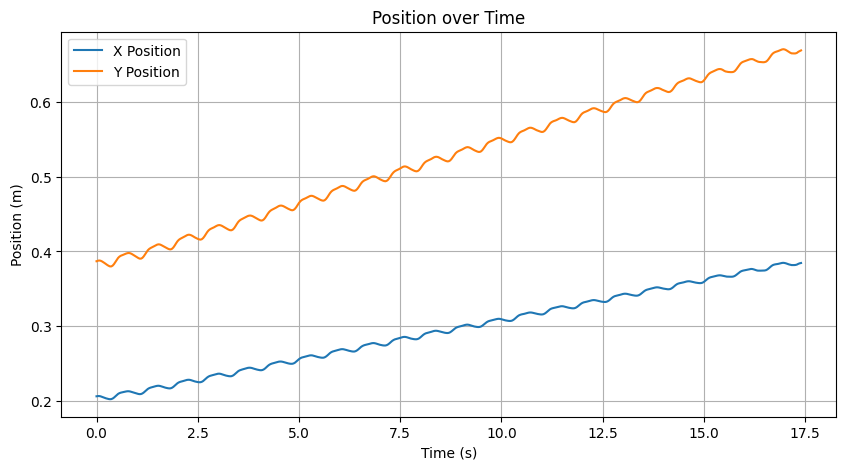

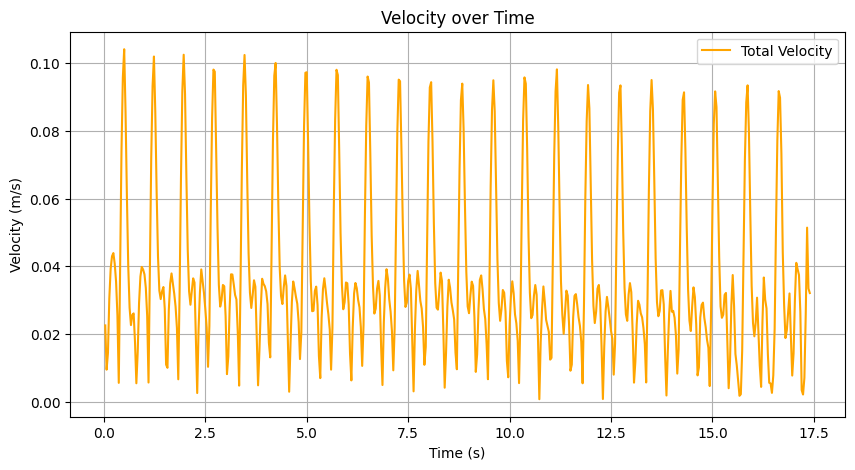

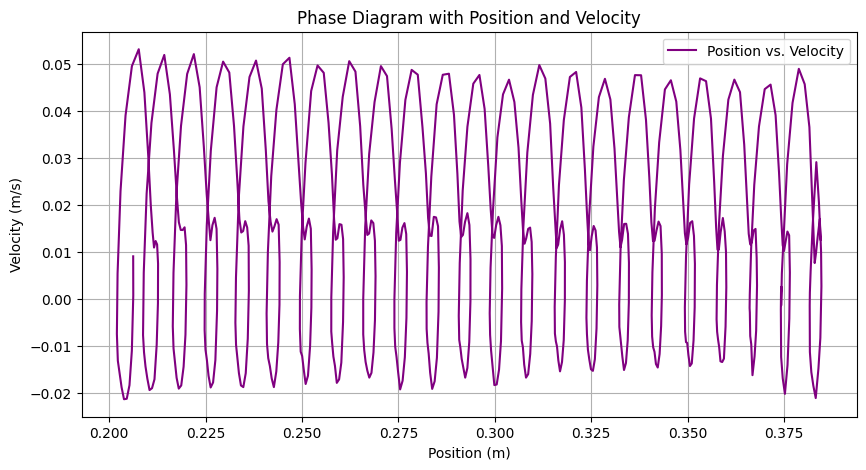

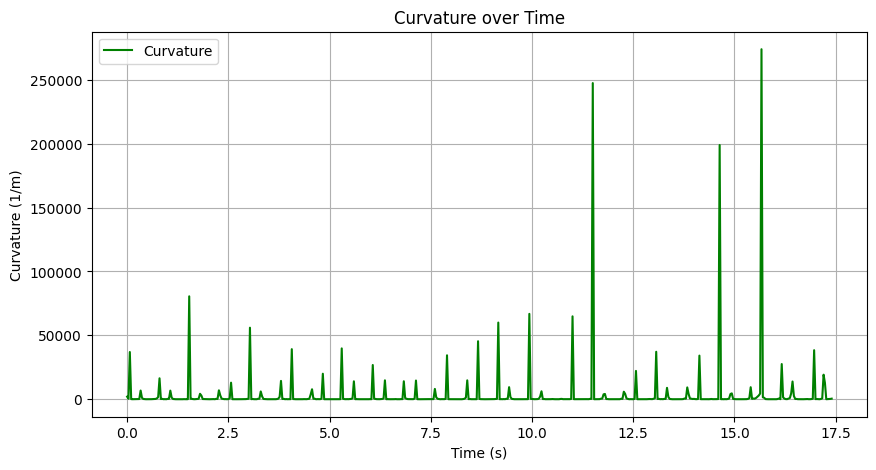

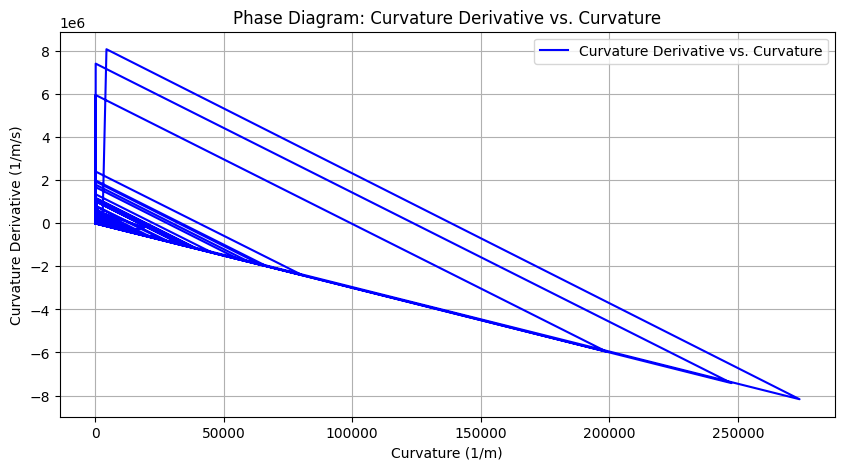

523


In [80]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to calculate curvature from B-spline derivatives
def calculate_b_spline_curvature(x_coords, y_coords):
    # Fit B-spline to the data
    tck, u = splprep([x_coords, y_coords], s=0, k=3)
    
    # Calculate first and second derivatives
    x_prime, y_prime = splev(u, tck, der=1)
    x_double_prime, y_double_prime = splev(u, tck, der=2)
    
    # Calculate curvature
    numerator = np.abs(x_prime * y_double_prime - y_prime * x_double_prime)
    denominator = (x_prime**2 + y_prime**2)**1.5
    curvature = numerator / denominator
    
    return curvature

# Function to process the data and perform plotting
def analyze_and_plot_with_b_spline_curvature(file_path, x_length_meters=0.5625, y_length_meters=1, fps=30, smooth_window=5):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers, skipping the first two rows
    coordinates_df = df.iloc[2:, :44].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate mean position over markers and smooth the data
    mean_x_position = smooth_data(x_coords.mean(axis=1), window_size=smooth_window).dropna()
    mean_y_position = smooth_data(y_coords.mean(axis=1), window_size=smooth_window).dropna()
    
    # Calculate velocity (numerical derivative) after smoothing
    velocity_x = mean_x_position.diff() * fps
    velocity_y = mean_y_position.diff() * fps
    total_velocity = np.sqrt(velocity_x**2 + velocity_y**2)
    
    # Calculate curvature using the B-spline method
    curvature = calculate_b_spline_curvature(mean_x_position.values, mean_y_position.values)

    # Calculate the derivative of curvature
    curvature_derivative = np.diff(curvature) * fps
    curvature_trimmed = curvature[:-1]  # Trim curvature to match derivative length

    # Adjust time array lengths to match each plot
    time = np.arange(len(mean_x_position)) / fps
    time_velocity = time[1:]  # Matches length of velocity arrays
    time_curvature = time[:len(curvature)]
    time_curvature_derivative = time[:len(curvature_derivative)]

    # Plot position over time
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position, label='X Position')
    plt.plot(time, mean_y_position, label='Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time_velocity, total_velocity[1:], label='Total Velocity', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot phase diagram (position vs. velocity)
    plt.figure(figsize=(10, 5))
    plt.plot(mean_x_position[1:], velocity_x[1:], label='Position vs. Velocity', color='purple')
    plt.xlabel('Position (m)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Phase Diagram with Position and Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot curvature over time
    plt.figure(figsize=(10, 5))
    plt.plot(time_curvature, curvature, label='Curvature', color='green')
    plt.xlabel('Time (s)')
    plt.ylabel('Curvature (1/m)')
    plt.title('Curvature over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot phase diagram with derivative of curvature vs. curvature
    plt.figure(figsize=(10, 5))
    plt.plot(curvature_trimmed, curvature_derivative, label='Curvature Derivative vs. Curvature', color='blue')
    plt.xlabel('Curvature (1/m)')
    plt.ylabel('Curvature Derivative (1/m/s)')
    plt.title('Phase Diagram: Curvature Derivative vs. Curvature')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(mean_x_position.size)

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'

# Run the function
analyze_and_plot_with_b_spline_curvature(file_path)




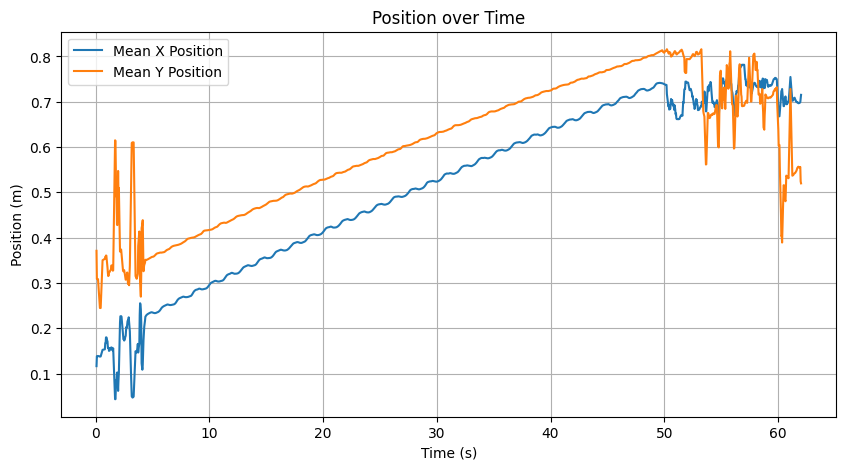

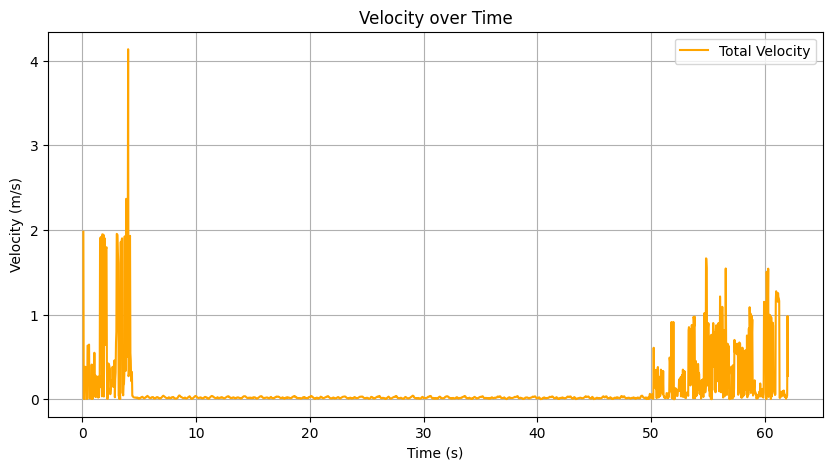

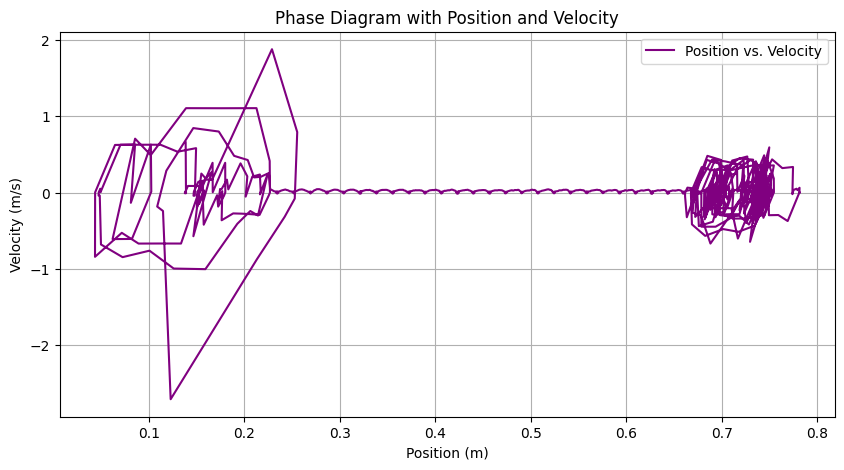

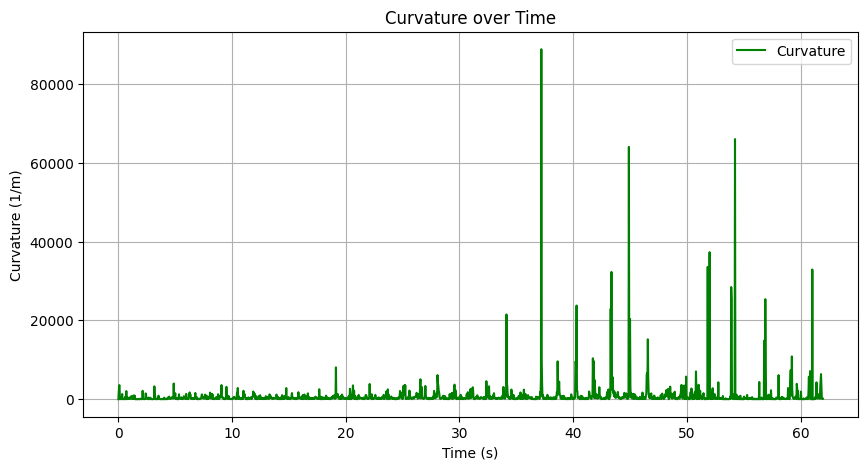

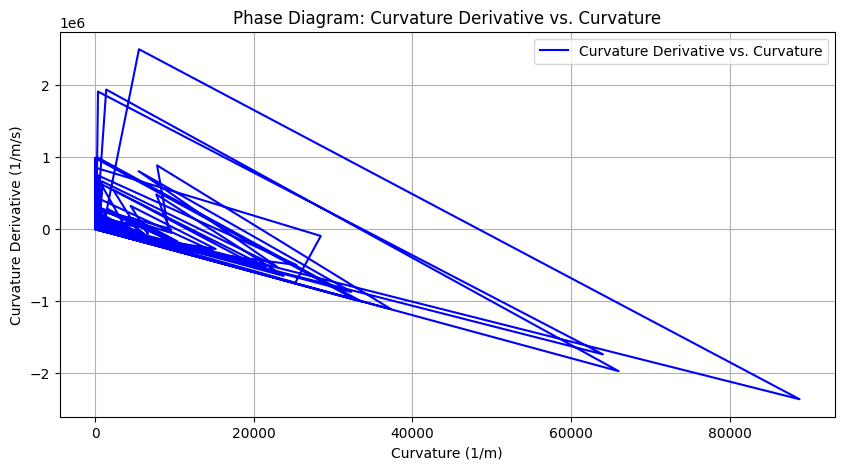

In [4]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev

# Function to calculate curvature from B-spline derivatives for specified markers
def calculate_b_spline_curvature_for_markers(marker_x, marker_y):
    # Fit B-spline to the data
    tck, u = splprep([marker_x, marker_y], s=0, k=3)
    
    # Calculate first and second derivatives
    x_prime, y_prime = splev(u, tck, der=1)
    x_double_prime, y_double_prime = splev(u, tck, der=2)
    
    # Calculate curvature
    numerator = np.abs(x_prime * y_double_prime - y_prime * x_double_prime)
    denominator = (x_prime**2 + y_prime**2)**1.5
    curvature = numerator / denominator
    
    return curvature

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to process the data and perform plotting
def analyze_and_plot_with_specific_marker_curvature(file_path, x_length_meters=0.5625, y_length_meters=1, fps=30):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract specific markers (e.g., Marker1, Marker2, Marker3) and normalize them
    # Adjust these indices based on your actual dataset
    marker1_x = df.iloc[2:, 0].astype(float) * normalization_factor_x
    marker1_y = df.iloc[2:, 1].astype(float) * normalization_factor_y
    marker2_x = df.iloc[2:, 2].astype(float) * normalization_factor_x
    marker2_y = df.iloc[2:, 3].astype(float) * normalization_factor_y
    marker3_x = df.iloc[2:, 4].astype(float) * normalization_factor_x
    marker3_y = df.iloc[2:, 5].astype(float) * normalization_factor_y

    # Calculate mean position over these three markers
    mean_x_position = smooth_data((marker1_x + marker2_x + marker3_x) / 3)
    mean_y_position = smooth_data((marker1_y + marker2_y + marker3_y) / 3)
    
    # Calculate velocity (numerical derivative)
    velocity_x = mean_x_position.diff() * fps
    velocity_y = mean_y_position.diff() * fps
    total_velocity = np.sqrt(velocity_x**2 + velocity_y**2)
    
    # Calculate curvature using the B-spline method for specific markers
    curvature = calculate_b_spline_curvature_for_markers(mean_x_position.dropna(), mean_y_position.dropna())

    # Calculate the derivative of curvature
    curvature_derivative = np.diff(curvature) * fps
    curvature_trimmed = curvature[:-1]  # Trim curvature to match derivative length

    # Adjust time array lengths to match each plot
    time = np.arange(len(mean_x_position)) / fps
    time_velocity = time[1:]  # Matches length of velocity arrays
    time_curvature = time[:len(curvature)]
    time_curvature_derivative = time[:len(curvature_derivative)]

    # Plot position over time
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position, label='Mean X Position')
    plt.plot(time, mean_y_position, label='Mean Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time_velocity, total_velocity[1:], label='Total Velocity', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot phase diagram (position vs. velocity)
    plt.figure(figsize=(10, 5))
    plt.plot(mean_x_position[1:], velocity_x[1:], label='Position vs. Velocity', color='purple')
    plt.xlabel('Position (m)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Phase Diagram with Position and Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot curvature over time
    plt.figure(figsize=(10, 5))
    plt.plot(time_curvature, curvature, label='Curvature', color='green')
    plt.xlabel('Time (s)')
    plt.ylabel('Curvature (1/m)')
    plt.title('Curvature over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot phase diagram with derivative of curvature vs. curvature
    plt.figure(figsize=(10, 5))
    plt.plot(curvature_trimmed, curvature_derivative, label='Curvature Derivative vs. Curvature', color='blue')
    plt.xlabel('Curvature (1/m)')
    plt.ylabel('Curvature Derivative (1/m/s)')
    plt.title('Phase Diagram: Curvature Derivative vs. Curvature')
    plt.legend()
    plt.grid(True)
    plt.show()

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/diffLength_data/32cm_new-James-2024-10-02/videos/32cm_run3DLC_resnet50_32cm_newOct2shuffle1_100000.csv'


# Run the function
analyze_and_plot_with_specific_marker_curvature(file_path)


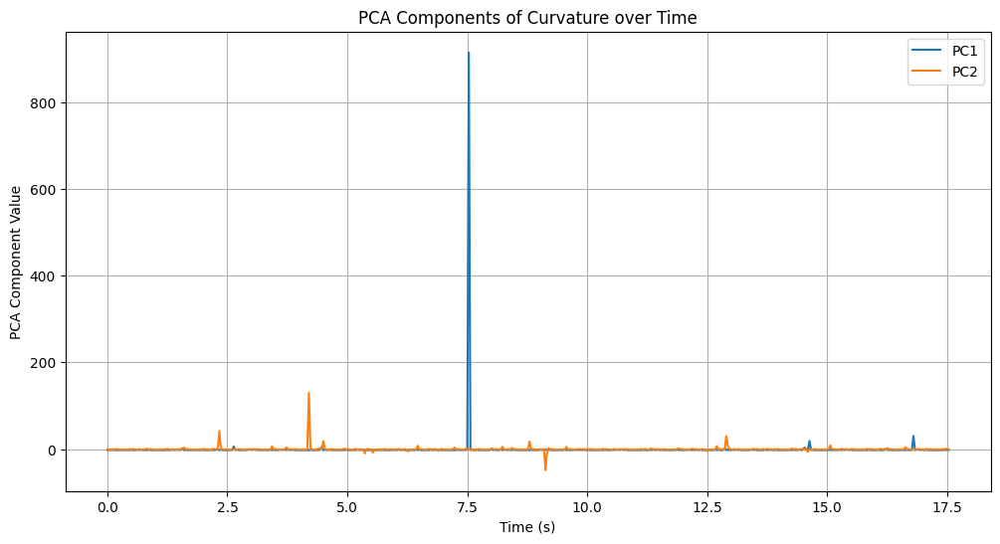

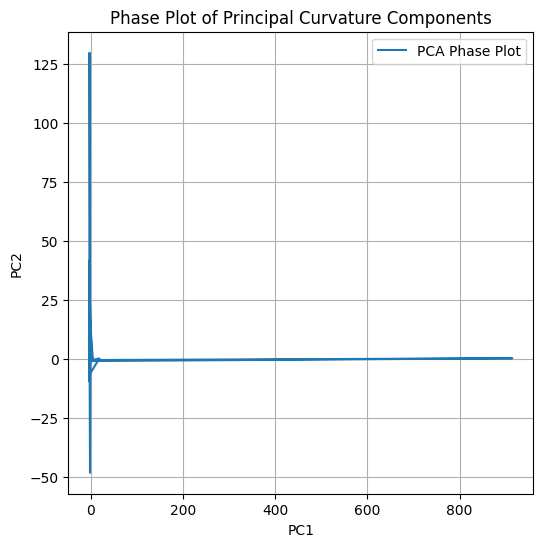

In [88]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords):
    # Determine the minimum number of columns to avoid out-of-bounds indexing
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    
    # Curvatures for all frames and points
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            # Avoid division by zero by setting curvature to zero when the denominator is zero
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            curvatures.append(curvature)
        all_curvatures.append(curvatures)
    
    curvatures_array = np.array(all_curvatures).T
    
    # Replace any remaining NaN values with zero, or alternatively drop rows with NaN
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    
    return curvatures_array

# Function to apply PCA on the curvature data
def apply_pca_on_curvature(curvatures, n_components=2):
    pca = PCA(n_components=n_components)
    pca_curvatures = pca.fit_transform(curvatures)
    return pca_curvatures, pca.explained_variance_ratio_

# Function to process data and plot PCA components of curvature
def analyze_and_plot_pca_curvature(file_path, fps=30, smooth_window=5):
    # Load CSV file
    df = pd.read_csv(file_path)
    
    # Assuming that x and y are separated in alternate columns
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords)
    
    # Apply PCA on curvatures
    pca_curvatures, variance_ratios = apply_pca_on_curvature(curvatures)
    
    # Plot the two principal components over time
    time = np.arange(len(pca_curvatures)) / fps
    plt.figure(figsize=(12, 6))
    plt.plot(time, pca_curvatures[:, 0], label='PC1')
    plt.plot(time, pca_curvatures[:, 1], label='PC2')
    plt.title('PCA Components of Curvature over Time')
    plt.xlabel('Time (s)')
    plt.ylabel('PCA Component Value')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the phase diagram
    plt.figure(figsize=(6, 6))
    plt.plot(pca_curvatures[:, 0], pca_curvatures[:, 1], label='PCA Phase Plot')
    plt.title('Phase Plot of Principal Curvature Components')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.grid(True)
    plt.legend()
    plt.show()

# Run the function
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_pca_curvature(file_path)


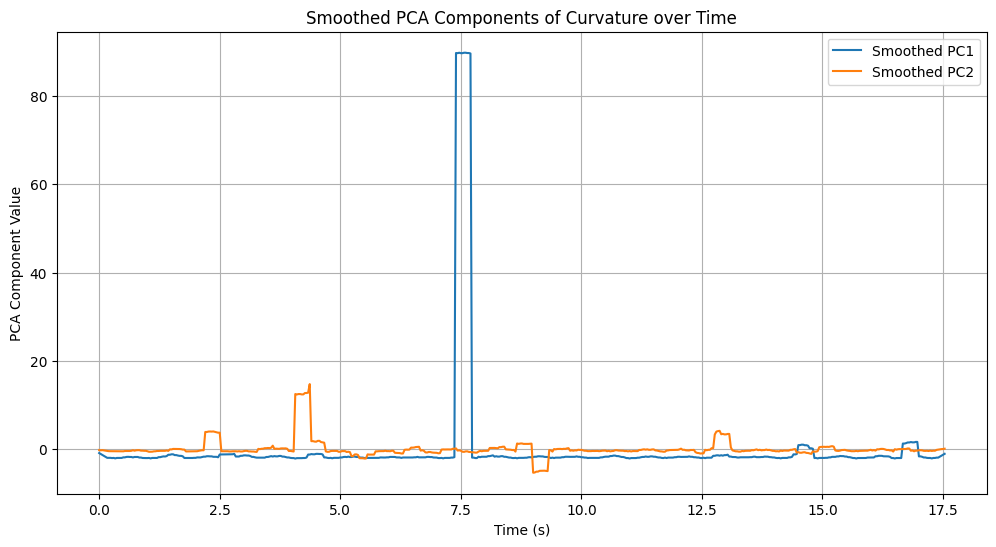

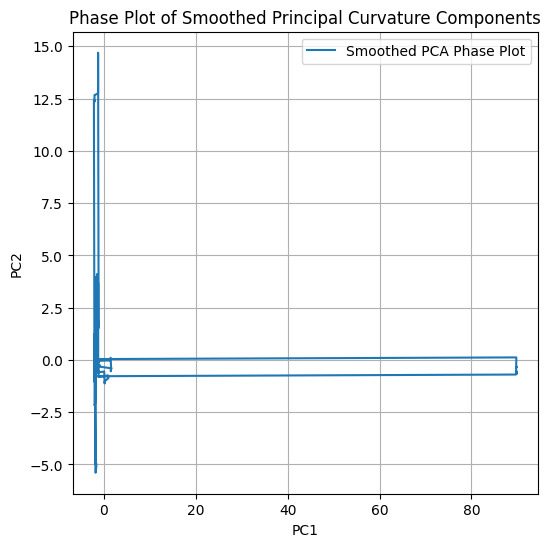

In [89]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords):
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            curvatures.append(curvature)
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to apply PCA on the curvature data
def apply_pca_on_curvature(curvatures, n_components=2):
    pca = PCA(n_components=n_components)
    pca_curvatures = pca.fit_transform(curvatures)
    return pca_curvatures, pca.explained_variance_ratio_

# Moving average filter
def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size) / window_size, mode='same')

# Function to process data and plot PCA components of curvature
def analyze_and_plot_pca_curvature(file_path, fps=30, smooth_window=5, filter_window=10):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords)
    
    # Apply PCA on curvatures
    pca_curvatures, variance_ratios = apply_pca_on_curvature(curvatures)
    
    # Apply moving average filter to smooth the PCA components
    smoothed_pc1 = moving_average(pca_curvatures[:, 0], filter_window)
    smoothed_pc2 = moving_average(pca_curvatures[:, 1], filter_window)
    
    # Plot the two smoothed principal components over time
    time = np.arange(len(pca_curvatures)) / fps
    plt.figure(figsize=(12, 6))
    plt.plot(time, smoothed_pc1, label='Smoothed PC1')
    plt.plot(time, smoothed_pc2, label='Smoothed PC2')
    plt.title('Smoothed PCA Components of Curvature over Time')
    plt.xlabel('Time (s)')
    plt.ylabel('PCA Component Value')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the smoothed phase diagram
    plt.figure(figsize=(6, 6))
    plt.plot(smoothed_pc1, smoothed_pc2, label='Smoothed PCA Phase Plot')
    plt.title('Phase Plot of Smoothed Principal Curvature Components')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.grid(True)
    plt.legend()
    plt.show()

# Run the function with your file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_pca_curvature(file_path)


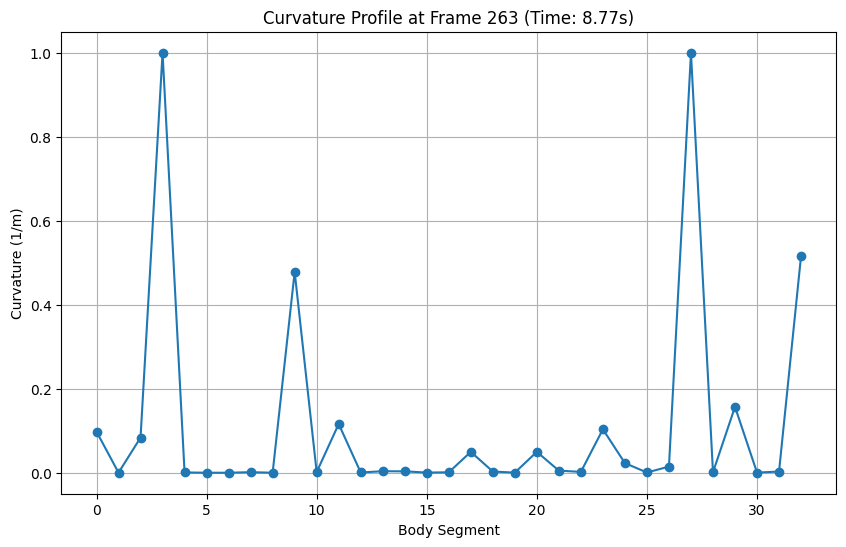

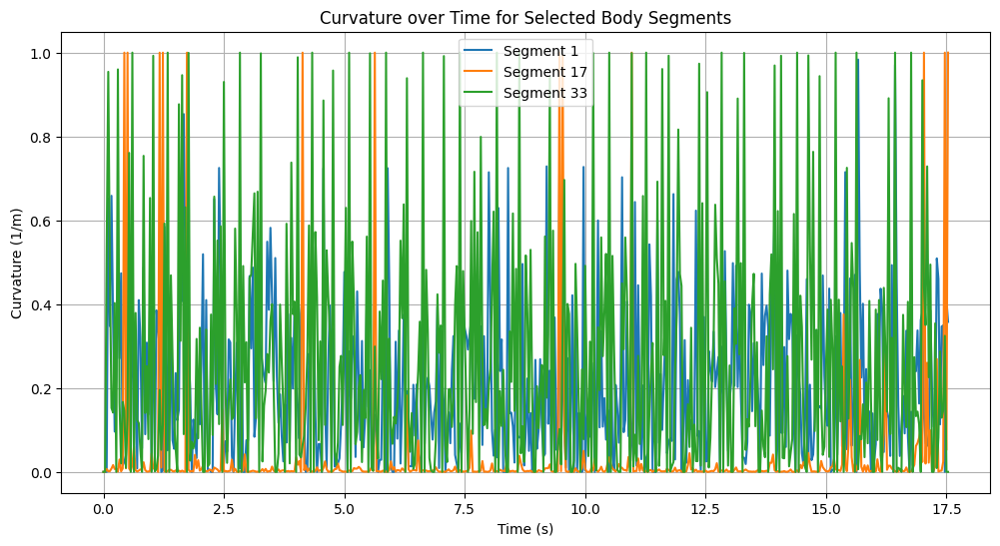

In [90]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords):
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            curvatures.append(curvature)
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to plot curvature profile and curvature over time
def plot_curvature_profiles(curvatures, fps=30):
    time = np.arange(curvatures.shape[0]) / fps
    body_segments = np.arange(curvatures.shape[1])

    # Choose a specific frame (e.g., halfway) for the curvature profile
    frame = curvatures.shape[0] // 2

    # Plot curvature profile for a specific time frame
    plt.figure(figsize=(10, 6))
    plt.plot(body_segments, curvatures[frame, :], marker='o')
    plt.title(f'Curvature Profile at Frame {frame} (Time: {frame / fps:.2f}s)')
    plt.xlabel('Body Segment')
    plt.ylabel('Curvature (1/m)')
    plt.grid(True)
    plt.show()

    # Plot curvature over time for selected body segments
    selected_segments = [0, curvatures.shape[1] // 2, curvatures.shape[1] - 1]  # First, middle, and last segments
    plt.figure(figsize=(12, 6))
    for segment in selected_segments:
        plt.plot(time, curvatures[:, segment], label=f'Segment {segment + 1}')
    plt.title('Curvature over Time for Selected Body Segments')
    plt.xlabel('Time (s)')
    plt.ylabel('Curvature (1/m)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to process data and plot PCA components of curvature and curvature profiles
def analyze_and_plot_pca_and_curvature_profiles(file_path, fps=30):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords)
    
    # Plot the curvature profile and curvature over time
    plot_curvature_profiles(curvatures, fps=fps)

# Run the function with your file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_pca_and_curvature_profiles(file_path)


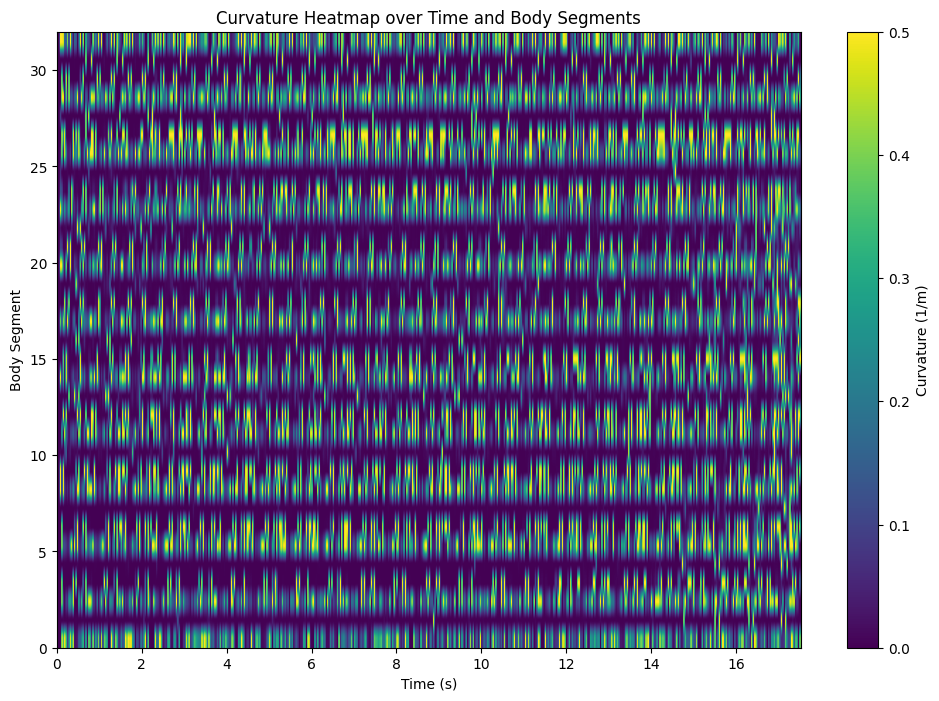

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords, max_curvature=100):  # Set a max curvature cap
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            # Cap the curvature to avoid outliers
            curvatures.append(min(curvature, max_curvature))
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to plot curvature heatmap over time and body segments
def plot_curvature_heatmap(curvatures, fps=30):
    time = np.arange(curvatures.shape[0]) / fps
    body_segments = np.arange(curvatures.shape[1])

    # Create the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(curvatures.T, aspect='auto', cmap='viridis', origin='lower', extent=[time.min(), time.max(), body_segments.min(), body_segments.max()])
    cbar = plt.colorbar()
    cbar.set_label('Curvature (1/m)')
    plt.xlabel('Time (s)')
    plt.ylabel('Body Segment')
    plt.title('Curvature Heatmap over Time and Body Segments')
    plt.show()

# Function to process data and plot the heatmap
def analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=0.5):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords, max_curvature=max_curvature)
    
    # Plot the curvature heatmap
    plot_curvature_heatmap(curvatures, fps=fps)

# Run the function with your file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_curvature_heatmap(file_path)


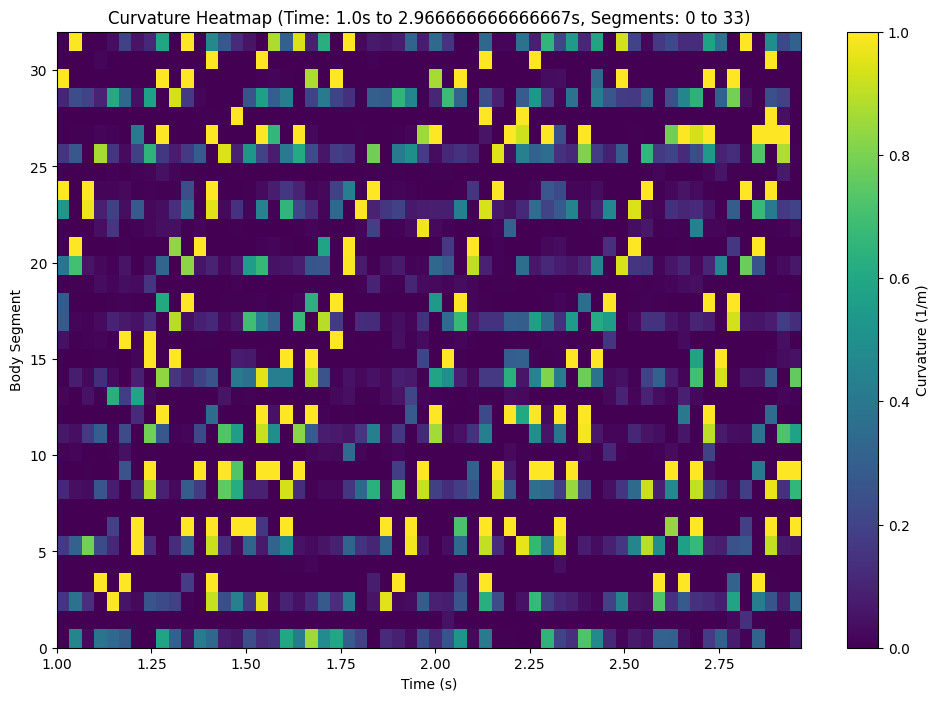

In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords, max_curvature=100):
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            # Cap the curvature to avoid outliers
            curvatures.append(min(curvature, max_curvature))
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to plot curvature heatmap over specified time and body segment range
def plot_curvature_heatmap(curvatures, fps=30, time_window=None, segment_range=None):
    total_time = len(curvatures) / fps
    total_segments = curvatures.shape[1]
    
    # Determine the time range for plotting
    if time_window:
        start_time, end_time = time_window
        start_index = int(start_time * fps)
        end_index = int(end_time * fps)
    else:
        start_index, end_index = 0, curvatures.shape[0]

    # Ensure indices are within valid range
    start_index = max(0, start_index)
    end_index = min(curvatures.shape[0], end_index)

    # Determine the segment range for plotting
    if segment_range:
        start_segment, end_segment = segment_range
    else:
        start_segment, end_segment = 0, total_segments
    
    # Ensure segment indices are within valid range
    start_segment = max(0, start_segment)
    end_segment = min(total_segments, end_segment)

    # Extract the subset for the time and segment range
    selected_curvatures = curvatures[start_index:end_index, start_segment:end_segment]
    time = np.arange(start_index, end_index) / fps
    segments = np.arange(start_segment, end_segment)

    # Create the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(selected_curvatures.T, aspect='auto', cmap='viridis', origin='lower',
               extent=[time.min(), time.max(), segments.min(), segments.max()])
    cbar = plt.colorbar()
    cbar.set_label('Curvature (1/m)')
    plt.xlabel('Time (s)')
    plt.ylabel('Body Segment')
    plt.title(f'Curvature Heatmap (Time: {time.min()}s to {time.max()}s, Segments: {start_segment} to {end_segment})')
    plt.show()

# Function to process data and plot the heatmap
def analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=1, time_window=None, segment_range=None):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords, max_curvature=max_curvature)
    
    # Plot the curvature heatmap with specified time and segment range
    plot_curvature_heatmap(curvatures, fps=fps, time_window=time_window, segment_range=segment_range)

# Set your file path and parameters
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=1, time_window=(1,3), segment_range=(0, 35))


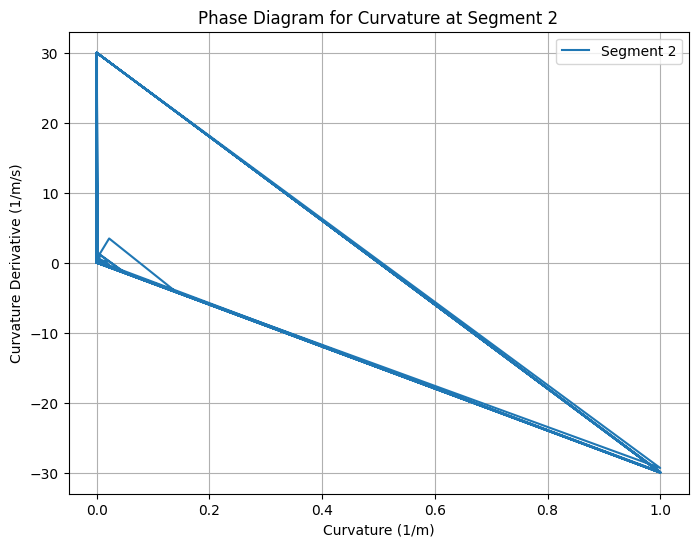

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords, max_curvature=100):
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            # Cap the curvature to avoid outliers
            curvatures.append(min(curvature, max_curvature))
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to plot the phase diagram for curvature
def plot_curvature_phase_diagram(curvatures, fps=30, segment_index=0):
    time = np.arange(curvatures.shape[0]) / fps

    # Extract the curvature for a specific segment or average of segments
    selected_curvature = curvatures[:, segment_index]
    
    # Calculate the time derivative of the selected curvature
    curvature_derivative = np.diff(selected_curvature) * fps
    # Adjust lengths to match (since diff reduces length by 1)
    selected_curvature = selected_curvature[:-1]
    time = time[:-1]

    # Plot the phase diagram
    plt.figure(figsize=(8, 6))
    plt.plot(selected_curvature, curvature_derivative, label=f'Segment {segment_index + 1}')
    plt.xlabel('Curvature (1/m)')
    plt.ylabel('Curvature Derivative (1/m/s)')
    plt.title(f'Phase Diagram for Curvature at Segment {segment_index + 1}')
    plt.grid(True)
    plt.legend()
    plt.show()

# Function to process data, calculate curvature, and plot the phase diagram
def analyze_and_plot_curvature_phase(file_path, fps=30, max_curvature=0.5, segment_index=0):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords, max_curvature=max_curvature)
    
    # Plot the phase diagram for the selected segment
    plot_curvature_phase_diagram(curvatures, fps=fps, segment_index=segment_index)

# Set your file path and parameters
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_curvature_phase(file_path, fps=30, max_curvature=10, segment_index=1)  # Change segment_index as desired


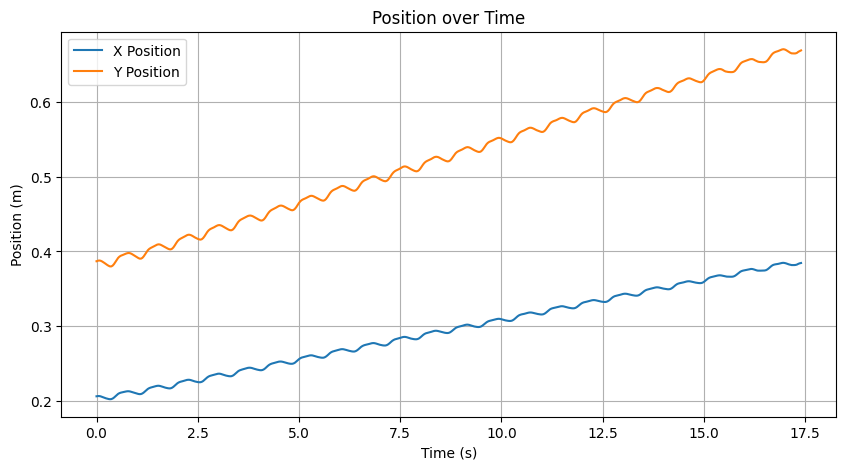

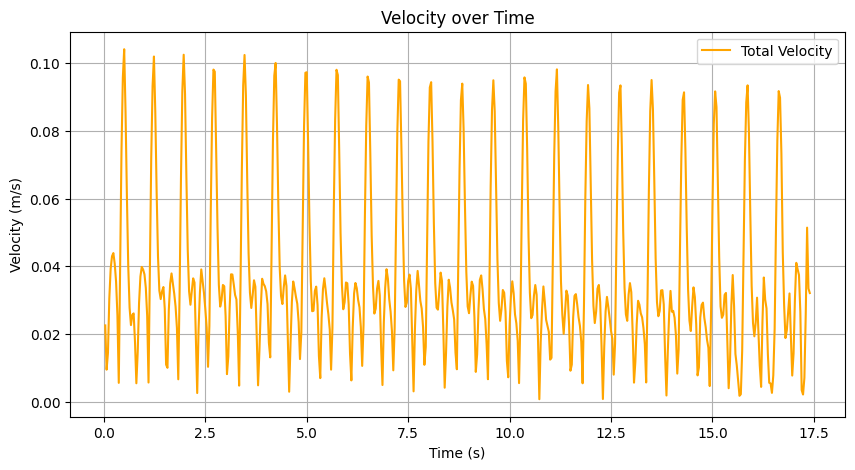

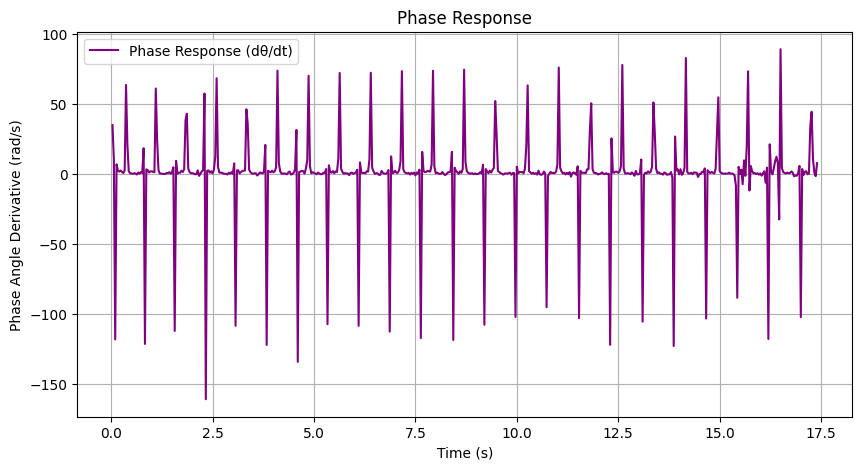

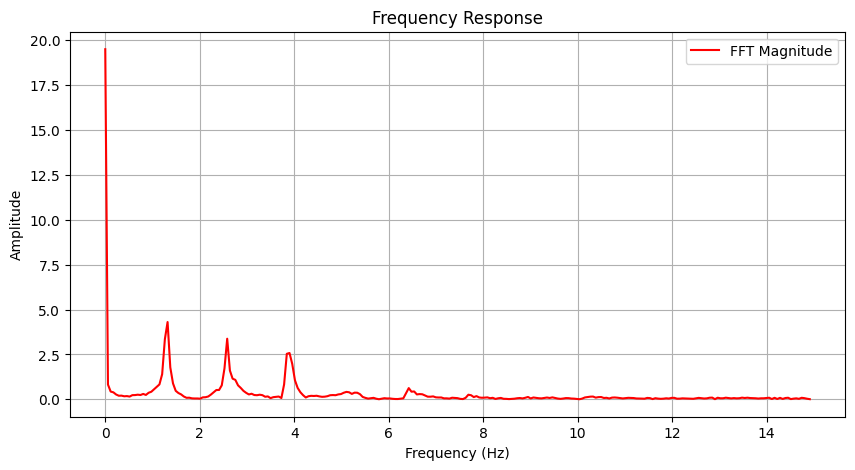

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
from scipy.fft import fft, fftfreq

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to calculate curvature from B-spline derivatives
def calculate_b_spline_curvature(x_coords, y_coords):
    tck, u = splprep([x_coords, y_coords], s=0, k=3)
    x_prime, y_prime = splev(u, tck, der=1)
    x_double_prime, y_double_prime = splev(u, tck, der=2)
    numerator = np.abs(x_prime * y_double_prime - y_prime * x_double_prime)
    denominator = (x_prime**2 + y_prime**2)**1.5
    curvature = numerator / denominator
    return curvature

# Function to process the data and perform plotting
def analyze_and_plot_with_b_spline_curvature(file_path, x_length_meters=0.5625, y_length_meters=1, fps=30, smooth_window=5):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers, skipping the first two rows
    coordinates_df = df.iloc[2:, :44].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate mean position over markers and smooth the data
    mean_x_position = smooth_data(x_coords.mean(axis=1), window_size=smooth_window).dropna()
    mean_y_position = smooth_data(y_coords.mean(axis=1), window_size=smooth_window).dropna()
    
    # Calculate velocity (numerical derivative) after smoothing
    velocity_x = mean_x_position.diff() * fps
    velocity_y = mean_y_position.diff() * fps
    total_velocity = np.sqrt(velocity_x**2 + velocity_y**2).fillna(0).to_numpy()  # Convert to NumPy array with NaNs replaced

    # Calculate curvature using the B-spline method
    curvature = calculate_b_spline_curvature(mean_x_position.values, mean_y_position.values)
    
    # Phase response curve calculation
    phase_angle = np.arctan2(velocity_y, velocity_x)
    phase_angle_diff = np.diff(phase_angle.fillna(0)) * fps  # Phase angle derivative

    # Fourier transform for frequency response
    n = len(total_velocity)
    freq = fftfreq(n, d=1/fps)
    fft_values = fft(total_velocity)  # Total velocity is now a NumPy array, no NaNs
    fft_magnitude = np.abs(fft_values[:n // 2])  # Positive frequencies only
    freq = freq[:n // 2]

    # Time arrays
    time = np.arange(len(mean_x_position)) / fps
    time_velocity = time[1:]  # Matches length of velocity arrays
    time_phase = time[1:]  # Matches length of phase angle differences

    # Plotting

    # Position over time
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position, label='X Position')
    plt.plot(time, mean_y_position, label='Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time_velocity, total_velocity[1:], label='Total Velocity', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Phase response curve
    plt.figure(figsize=(10, 5))
    plt.plot(time_phase, phase_angle_diff, label='Phase Response (dθ/dt)', color='purple')
    plt.xlabel('Time (s)')
    plt.ylabel('Phase Angle Derivative (rad/s)')
    plt.title('Phase Response')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Frequency response
    plt.figure(figsize=(10, 5))
    plt.plot(freq, fft_magnitude, label='FFT Magnitude', color='red')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude')
    plt.title('Frequency Response')
    plt.legend()
    plt.grid(True)
    plt.show()

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'

# Run the function
analyze_and_plot_with_b_spline_curvature(file_path)


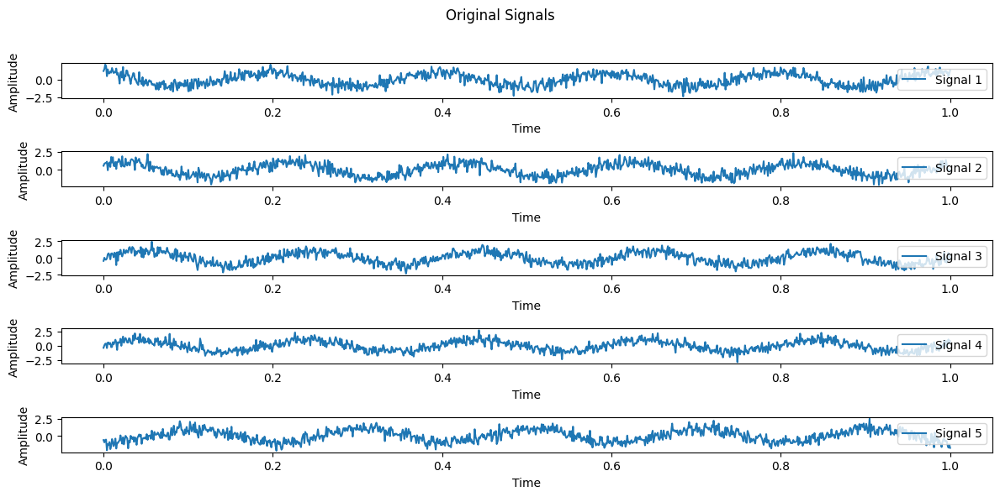

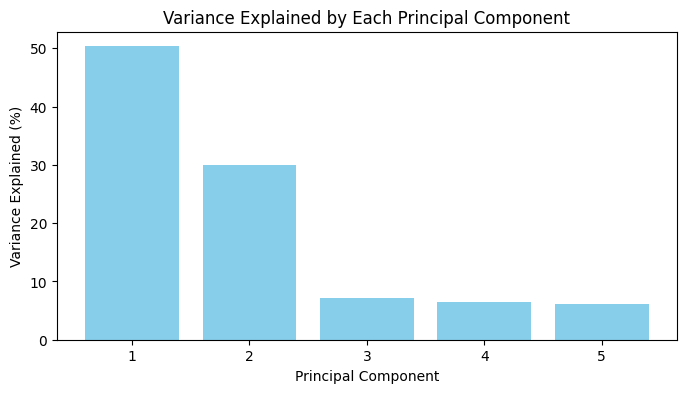

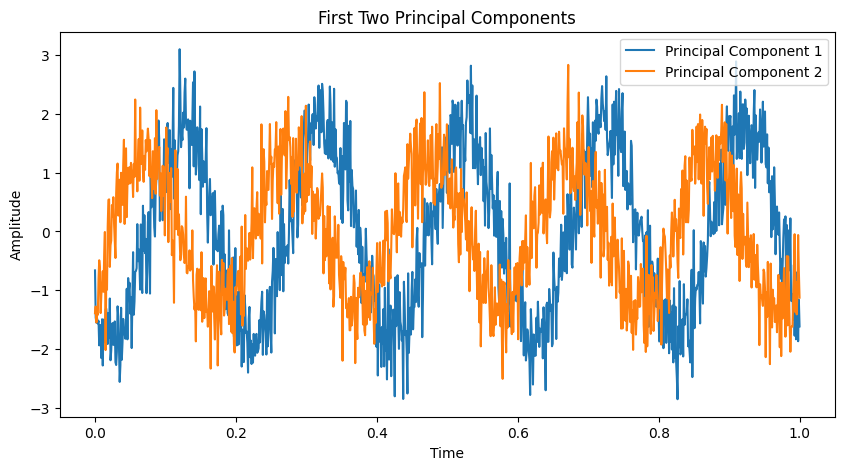

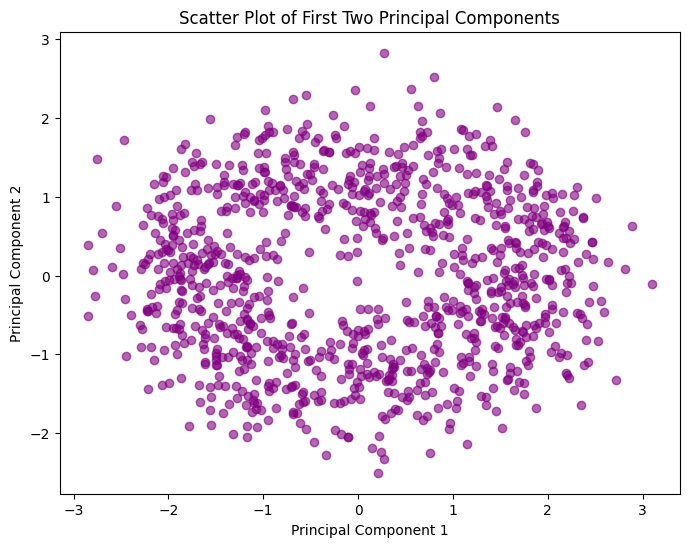

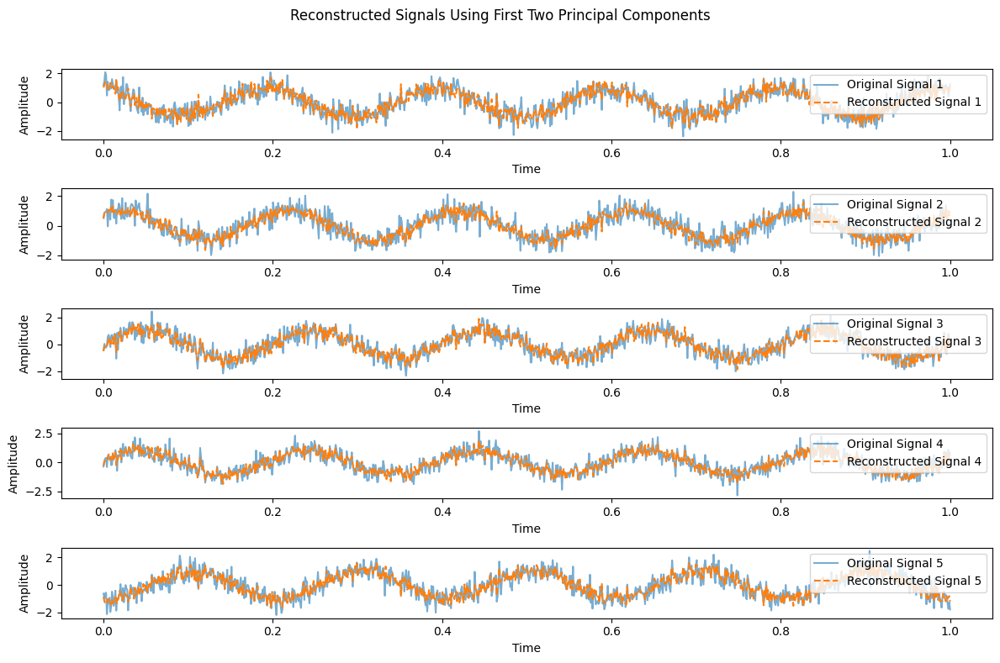

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Generate synthetic multi-channel signal data (5 channels, 1000 time points)
np.random.seed(0)
time = np.linspace(0, 1, 1000)
signals = np.array([np.sin(2 * np.pi * 5 * time + np.random.randn()) + 0.5 * np.random.randn(1000) for _ in range(5)])

# Apply PCA to the multi-channel signal data
pca = PCA(n_components=5)  # Use 5 components initially to capture full variance
signals_pca = pca.fit_transform(signals.T)  # Transpose for shape (samples, features)

# Plot the original signals
plt.figure(figsize=(12, 6))
for i in range(signals.shape[0]):
    plt.subplot(5, 1, i + 1)
    plt.plot(time, signals[i], label=f'Signal {i+1}')
    plt.legend(loc='upper right')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
plt.suptitle('Original Signals')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Plot the explained variance ratio
plt.figure(figsize=(8, 4))
plt.bar(range(1, 6), pca.explained_variance_ratio_ * 100, color='skyblue')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained (%)')
plt.title('Variance Explained by Each Principal Component')
plt.show()

# Plot the first two principal components over time
plt.figure(figsize=(10, 5))
plt.plot(time, signals_pca[:, 0], label='Principal Component 1')
plt.plot(time, signals_pca[:, 1], label='Principal Component 2')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('First Two Principal Components')
plt.legend()
plt.show()

# Scatter plot of the first two principal components
plt.figure(figsize=(8, 6))
plt.scatter(signals_pca[:, 0], signals_pca[:, 1], alpha=0.6, color='purple')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Scatter Plot of First Two Principal Components')
plt.show()

# Reconstruct the signals using only the first two principal components
reconstructed_signals = pca.inverse_transform(np.hstack((signals_pca[:, :2], np.zeros((signals_pca.shape[0], 3)))))

# Plot the reconstructed signals vs. original signals
plt.figure(figsize=(12, 8))
for i in range(signals.shape[0]):
    plt.subplot(5, 1, i + 1)
    plt.plot(time, signals[i], label=f'Original Signal {i+1}', alpha=0.6)
    plt.plot(time, reconstructed_signals[:, i], label=f'Reconstructed Signal {i+1}', linestyle='--')
    plt.legend(loc='upper right')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
plt.suptitle('Reconstructed Signals Using First Two Principal Components')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


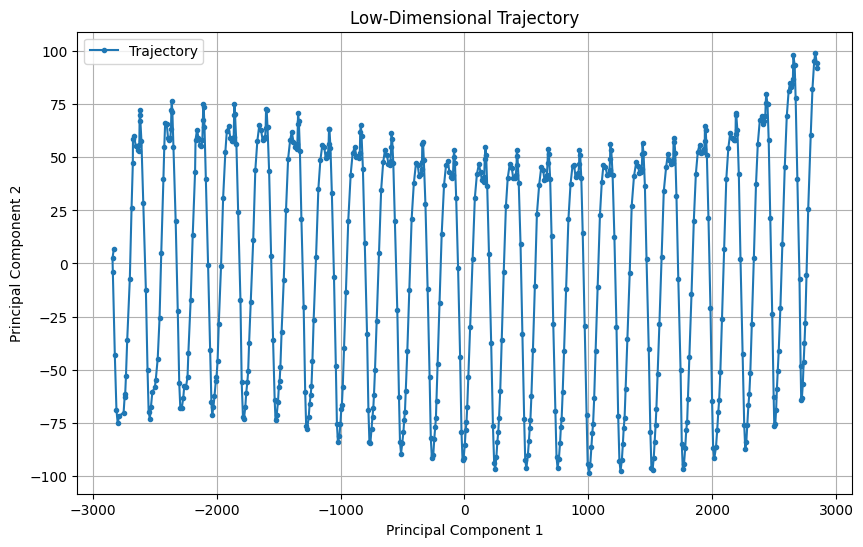

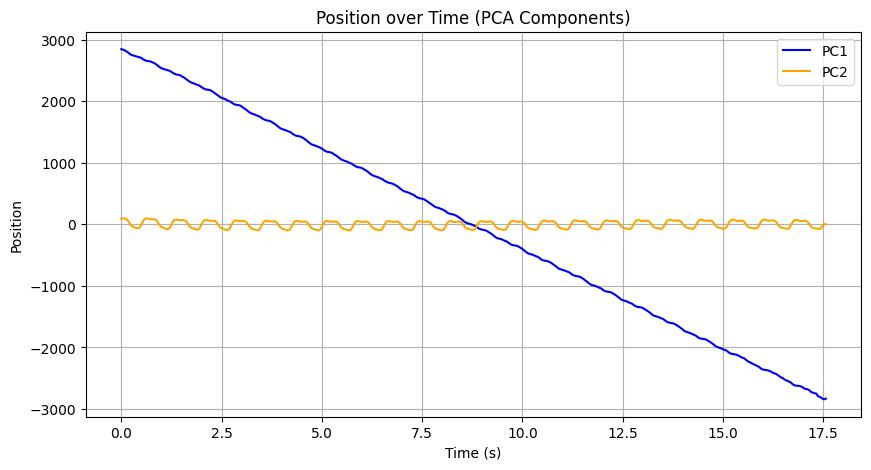

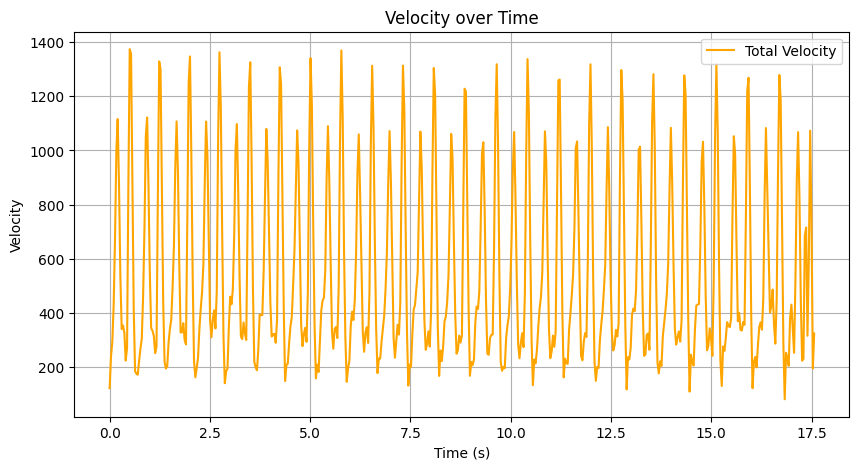

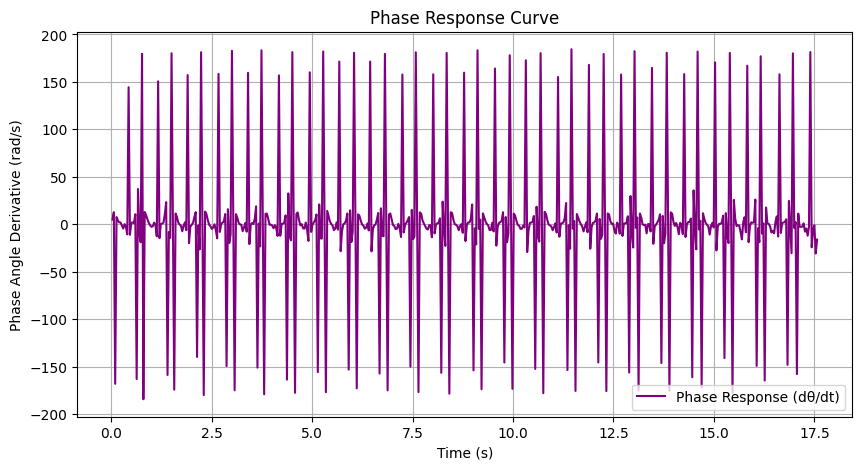

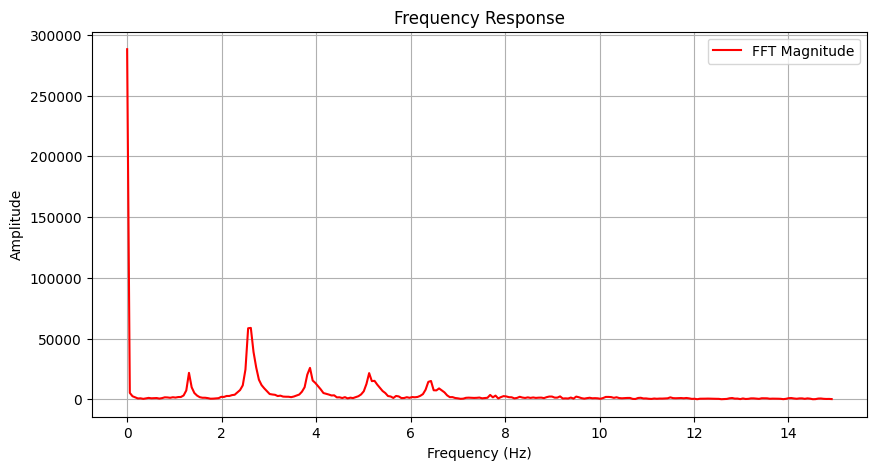

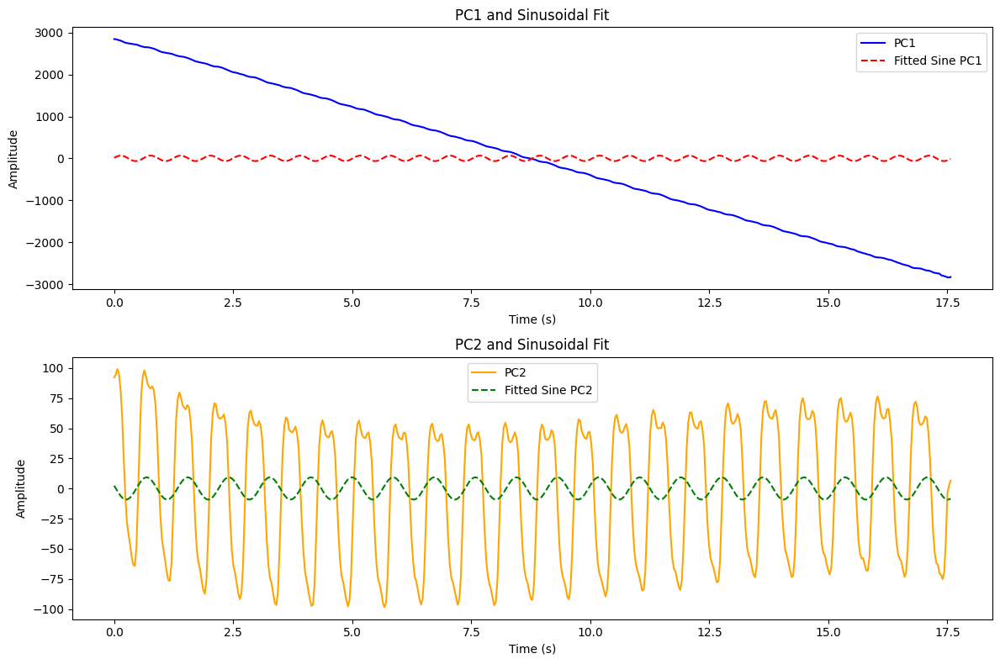

/var/folders/wv/gyf44h3j2j7_0l6h0jpy65mm0000gn/T/ipykernel_8739/209919788.py:124: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=low_dim_data[:, 0], y=low_dim_data[:, 1], cmap="Blues", shade=True)


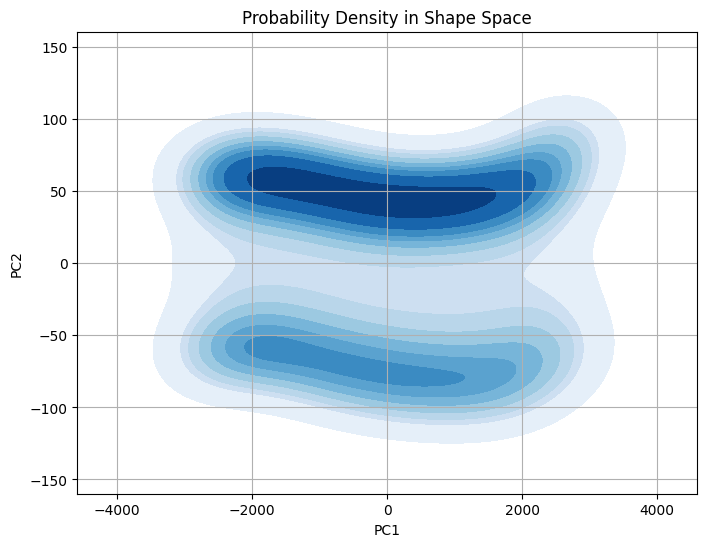

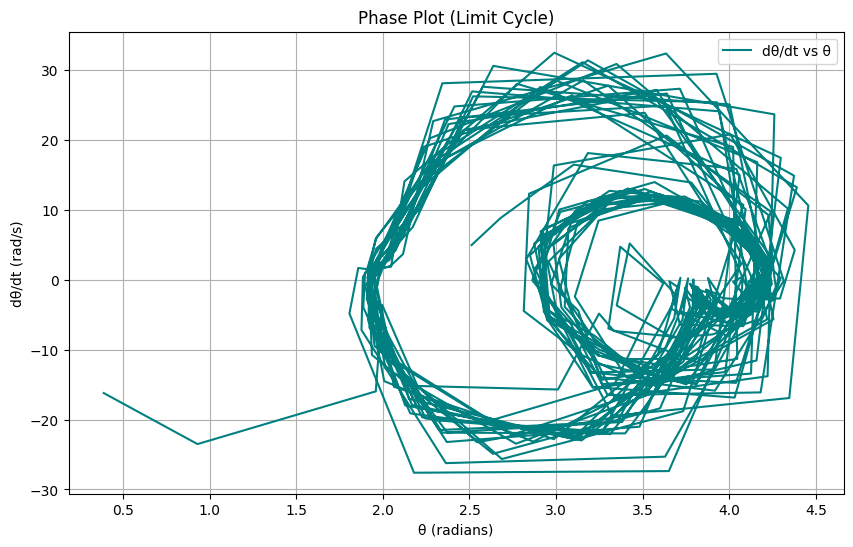

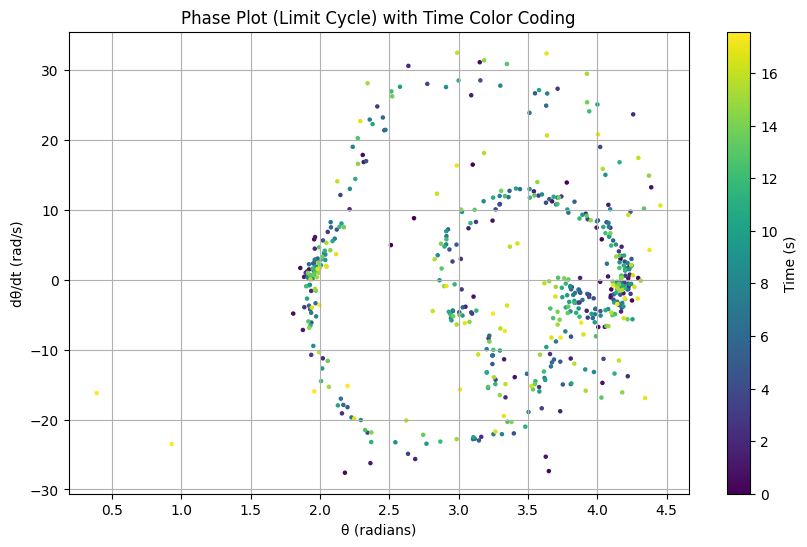

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


System does not converge within the observed time frame.


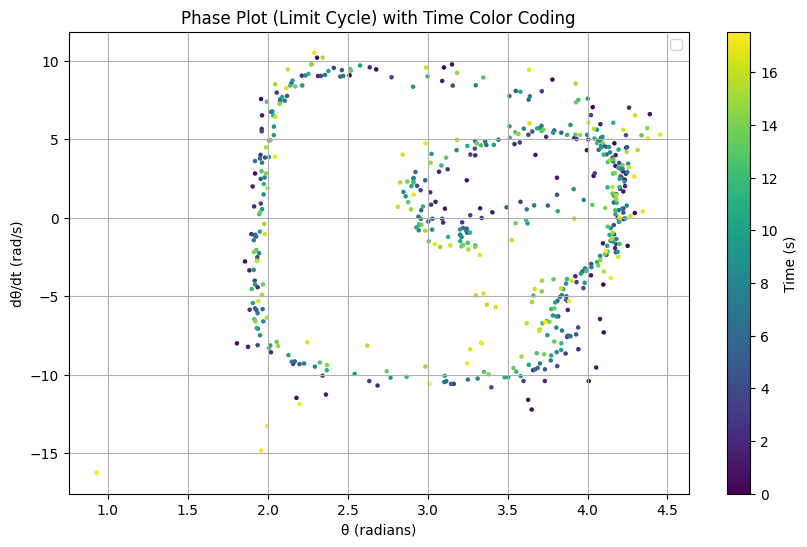

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


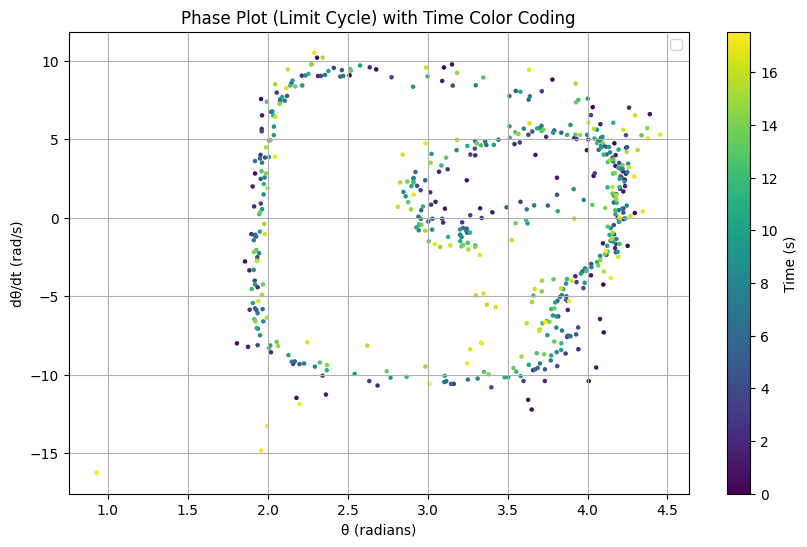

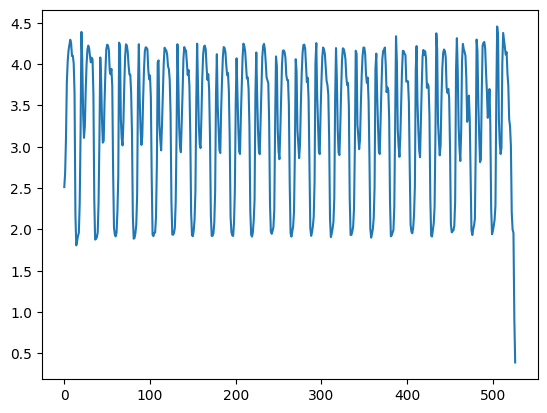

In [154]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.optimize import curve_fit
from scipy.fft import fft, fftfreq
from scipy.signal import hilbert
import seaborn as sns

# Load and clean data
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
data = pd.read_csv(file_path)

# Convert to numeric and drop non-numeric columns
data = data.apply(pd.to_numeric, errors='coerce').dropna()

# Apply PCA
pca = PCA(n_components=2)
low_dim_data = pca.fit_transform(data.values)  # Ensure data is only numeric

# Create a time variable assuming a frame rate of 30 Hz
fps = 30  # Adjust as needed
time = np.linspace(0, len(low_dim_data) / fps, len(low_dim_data))

# Plot the trajectory in the PCA-reduced space
plt.figure(figsize=(10, 6))
plt.plot(low_dim_data[:, 0], low_dim_data[:, 1], label='Trajectory', marker='o', markersize=3)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Low-Dimensional Trajectory')
plt.legend()
plt.grid(True)
plt.show()

# Position over Time
plt.figure(figsize=(10, 5))
plt.plot(time, low_dim_data[:, 0], label='PC1', color='blue')
plt.plot(time, low_dim_data[:, 1], label='PC2', color='orange')
plt.xlabel('Time (s)')
plt.ylabel('Position')
plt.title('Position over Time (PCA Components)')
plt.legend()
plt.grid(True)
plt.show()

# Velocity over Time
velocity_pc1 = np.gradient(low_dim_data[:, 0], time)
velocity_pc2 = np.gradient(low_dim_data[:, 1], time)
total_velocity = np.sqrt(velocity_pc1**2 + velocity_pc2**2)

plt.figure(figsize=(10, 5))
plt.plot(time, total_velocity, label='Total Velocity', color='orange')
plt.xlabel('Time (s)')
plt.ylabel('Velocity')
plt.title('Velocity over Time')
plt.legend()
plt.grid(True)
plt.show()

# Phase Response Curve
phase_angle = np.arctan2(velocity_pc2, velocity_pc1)
phase_angle_diff = np.diff(phase_angle) * fps  # Convert to radians per second

plt.figure(figsize=(10, 5))
plt.plot(time[1:], phase_angle_diff, label='Phase Response (dθ/dt)', color='purple')
plt.xlabel('Time (s)')
plt.ylabel('Phase Angle Derivative (rad/s)')
plt.title('Phase Response Curve')
plt.legend()
plt.grid(True)
plt.show()

# Frequency Response
n = len(total_velocity)
freq = fftfreq(n, d=1/fps)  # Sampling frequency
fft_values = fft(total_velocity)
fft_magnitude = np.abs(fft_values[:n // 2])  # Positive frequencies only
freq = freq[:n // 2]

plt.figure(figsize=(10, 5))
plt.plot(freq, fft_magnitude, label='FFT Magnitude', color='red')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Frequency Response')
plt.legend()
plt.grid(True)
plt.show()

# Define a sine function for fitting
def sine_wave(x, A, B, C, D):
    return A * np.sin(B * x + C) + D

# Fit the sine wave model to both PC1 and PC2
params_pc1, _ = curve_fit(sine_wave, time, low_dim_data[:, 0], p0=[1, 2*np.pi, 0, 0])
params_pc2, _ = curve_fit(sine_wave, time, low_dim_data[:, 1], p0=[1, 2*np.pi, 0, 0])

# Generate fitted data
fitted_pc1 = sine_wave(time, *params_pc1)
fitted_pc2 = sine_wave(time, *params_pc2)

# Plot the PCs and their sinusoidal fits
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.plot(time, low_dim_data[:, 0], label='PC1', color='blue')
plt.plot(time, fitted_pc1, '--', label='Fitted Sine PC1', color='red')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('PC1 and Sinusoidal Fit')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(time, low_dim_data[:, 1], label='PC2', color='orange')
plt.plot(time, fitted_pc2, '--', label='Fitted Sine PC2', color='green')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('PC2 and Sinusoidal Fit')
plt.legend()

plt.tight_layout()
plt.show()

# Density plot in shape space
plt.figure(figsize=(8, 6))
sns.kdeplot(x=low_dim_data[:, 0], y=low_dim_data[:, 1], cmap="Blues", shade=True)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Probability Density in Shape Space')
plt.grid(True)
plt.show()

# Existing code up to the phase response curve...

# Unwrap the phase angle to prevent discontinuities
phase_angle_unwrapped = np.unwrap(phase_angle)

# Compute dθ/dt using gradient (to get the same length as phase_angle_unwrapped)
dtheta_dt = np.gradient(phase_angle_unwrapped, time)

# Optionally, wrap θ back into [0, 2π]
theta_wrapped = np.mod(phase_angle_unwrapped, 2 * np.pi)

# Create the phase plot (limit cycle)
plt.figure(figsize=(10, 6))
plt.plot(theta_wrapped, dtheta_dt, label='dθ/dt vs θ', color='teal')
plt.xlabel('θ (radians)')
plt.ylabel('dθ/dt (rad/s)')
plt.title('Phase Plot (Limit Cycle)')
plt.legend()
plt.grid(True)
plt.show()

# ... [Your previous code above]

# Phase Response Curve (if not already computed)
phase_angle = np.arctan2(velocity_pc2, velocity_pc1)

# Unwrap the phase angle to prevent discontinuities
phase_angle_unwrapped = np.unwrap(phase_angle)

# Compute dθ/dt using gradient
dtheta_dt = np.gradient(phase_angle_unwrapped, time)

# Optionally, wrap θ back into [0, 2π]
theta_wrapped = np.mod(phase_angle_unwrapped, 2 * np.pi)

# Create the phase plot (limit cycle) with color denoting time
plt.figure(figsize=(10, 6))
scatter = plt.scatter(theta_wrapped, dtheta_dt, c=time, cmap='viridis', s=5)
plt.xlabel('θ (radians)')
plt.ylabel('dθ/dt (rad/s)')
plt.title('Phase Plot (Limit Cycle) with Time Color Coding')
plt.colorbar(scatter, label='Time (s)')
plt.grid(True)
plt.show()

# ... [Your previous code for loading data and computing phase angles] ...

# Unwrap the phase angle to prevent discontinuities
phase_angle_unwrapped = np.unwrap(phase_angle)

# Compute dθ/dt using gradient
dtheta_dt = np.gradient(phase_angle_unwrapped, time)

# Optional smoothing
from scipy.ndimage import gaussian_filter1d
dtheta_dt_smooth = gaussian_filter1d(dtheta_dt, sigma=2)

# Optionally, wrap θ back into [0, 2π]
theta_wrapped = np.mod(phase_angle_unwrapped, 2 * np.pi)

# Compute the absolute change in dθ/dt
delta_dtheta_dt = np.abs(np.diff(dtheta_dt_smooth))

# Define a threshold for convergence
threshold = 0.1  # Adjust as needed

# Define a window size for sustained convergence
window_size = int(fps * 10)  # 1 second window

# Identify indices where the absolute change is below the threshold
convergence_indices = np.where(delta_dtheta_dt < threshold)[0]

# Find the first index where convergence is sustained
for idx in convergence_indices:
    if idx + window_size < len(delta_dtheta_dt):
        if np.all(delta_dtheta_dt[idx:idx + window_size] < threshold):
            convergence_idx = idx
            break
else:
    convergence_idx = None

# Get the convergence time
if convergence_idx is not None:
    convergence_time = time[convergence_idx]
    print(f"System converges to steady state at approximately t = {convergence_time:.2f} seconds.")
else:
    print("System does not converge within the observed time frame.")

# Create the phase plot (limit cycle) with color denoting time
plt.figure(figsize=(10, 6))
scatter = plt.scatter(theta_wrapped[:-1], dtheta_dt_smooth[:-1], c=time[:-1], cmap='viridis', s=5)

# Shade the transient phase
if convergence_idx is not None:
    plt.axvspan(0, theta_wrapped[convergence_idx], color='gray', alpha=0.1, label='Transient Phase')

# Add a marker at the convergence point
if convergence_idx is not None:
    plt.scatter(theta_wrapped[convergence_idx], dtheta_dt_smooth[convergence_idx], color='red', s=50, label='Convergence Point')
    plt.axvline(theta_wrapped[convergence_idx], color='red', linestyle='--', alpha=0.5)
    plt.axhline(dtheta_dt_smooth[convergence_idx], color='red', linestyle='--', alpha=0.5)

plt.xlabel('θ (radians)')
plt.ylabel('dθ/dt (rad/s)')
plt.title('Phase Plot (Limit Cycle) with Time Color Coding')
plt.colorbar(scatter, label='Time (s)')
plt.legend()
plt.grid(True)
plt.show()

# Create the phase plot (limit cycle) with color denoting time
plt.figure(figsize=(10, 6))
scatter = plt.scatter(theta_wrapped[:-1], dtheta_dt_smooth[:-1], c=time[:-1], cmap='viridis', s=5)

# Add a marker at the convergence point
if convergence_idx is not None:
    plt.scatter(theta_wrapped[convergence_idx], dtheta_dt_smooth[convergence_idx], color='red', s=50, label=f'Convergence Point ({convergence_time:.2f} s)')
    plt.axvline(theta_wrapped[convergence_idx], color='red', linestyle='--', alpha=0.5)
    plt.axhline(dtheta_dt_smooth[convergence_idx], color='red', linestyle='--', alpha=0.5)

plt.xlabel('θ (radians)')
plt.ylabel('dθ/dt (rad/s)')
plt.title('Phase Plot (Limit Cycle) with Time Color Coding')
plt.colorbar(scatter, label='Time (s)')
plt.legend()
plt.grid(True)
plt.show()



plt.plot(phase_angle_unwrapped)

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
from sklearn.decomposition import PCA
from scipy.optimize import curve_fit

# Load the tracking data
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
data = pd.read_csv(file_path)
data_numeric = data.select_dtypes(include=[np.number])

# Print the shape and first few rows of the data to inspect
print("Data shape:", data_numeric.shape)
print("First few rows of data:")
print(data_numeric.head())

# Extract coordinates for each point along the body (assuming alternating x and y columns)
x_coords = data_numeric.iloc[:, ::2]
y_coords = data_numeric.iloc[:, 1::2]

# Verify if x_coords and y_coords are extracted correctly
print("x_coords shape:", x_coords.shape)
print("y_coords shape:", y_coords.shape)
print("First few rows of x_coords:")
print(x_coords.head())
print("First few rows of y_coords:")
print(y_coords.head())

# Filter out rows with NaNs across both x and y coordinates
x_coords = x_coords.dropna()
y_coords = y_coords.dropna()

# Re-check shapes after dropping NaNs
print("x_coords shape after dropping NaNs:", x_coords.shape)
print("y_coords shape after dropping NaNs:", y_coords.shape)

# Function to calculate curvature using B-spline derivatives
def calculate_b_spline_curvature(x, y):
    try:
        # Ensure there are no NaNs in the input data
        x = x.dropna().values
        y = y.dropna().values
        
        # Check if the number of points is sufficient for the quadratic spline (k=2)
        if len(x) > 2:
            tck, u = splprep([x, y], s=0, k=2)
            dx, dy = splev(u, tck, der=1)
            ddx, ddy = splev(u, tck, der=2)
            curvature = np.abs(dx * ddy - dy * ddx) / (dx**2 + dy**2)**1.5
        else:
            print(f"Insufficient points for spline fitting in frame with x: {x}, y: {y}")
            curvature = np.full(len(x), np.nan)
        return curvature
    except TypeError as e:
        print(f"Error calculating curvature: {e}")
        return np.full(len(x), np.nan)  # Return NaNs if there's an error

# Calculate curvature for each time step with debugging
curvatures = np.array([calculate_b_spline_curvature(x_coords.iloc[i], y_coords.iloc[i]) for i in range(len(x_coords))])

# Check if any frames had insufficient data points
print(f"Total frames calculated: {len(curvatures)}")
print(f"Frames with valid curvature data: {np.sum(~np.isnan(curvatures).all(axis=1))}")

# Filter out any rows that contain NaNs to avoid issues with PCA
curvatures = np.array([c for c in curvatures if not np.isnan(c).any()])

# Check if the filtered curvatures array is empty or has the right shape
if curvatures.size == 0 or curvatures.shape[1] == 0:
    print("No valid curvature data found for PCA. Please check the input data.")
else:
    # Apply PCA on the curvature data with valid rows
    pca = PCA(n_components=2)
    curvature_pca = pca.fit_transform(curvatures)

    # Generate the sinusoidal functions for v1(s) and v2(s) based on body length
    s = np.linspace(0, 1, curvatures.shape[1])  # Normalize by body length
    v1 = np.sin(2 * np.pi * s)
    v2 = np.cos(2 * np.pi * s)
    
    # Reconstruct the curvature as a combination of the two modes
    w1, w2 = curvature_pca[:, 0], curvature_pca[:, 1]
    reconstructed_curvature = np.outer(w1, v1) + np.outer(w2, v2)
    
    # Plot the first two principal components of curvature (low-dimensional representation)
    plt.figure(figsize=(10, 6))
    plt.plot(curvature_pca[:, 0], curvature_pca[:, 1], marker='o', linestyle='-', markersize=4, label='Trajectory in PC space')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('Curvature-Based Trajectory in PCA Space')
    plt.grid(True)
    plt.legend()
    plt.show()
    
    # Plot original vs reconstructed curvature for the first frame
    time = np.linspace(0, len(w1) / 30, len(w1))  # Assuming 30 fps
    plt.figure(figsize=(12, 6))
    plt.plot(s, curvatures[0], label='Original Curvature - First Frame')
    plt.plot(s, reconstructed_curvature[0], '--', label='Reconstructed Curvature - First Frame')
    plt.xlabel('Normalized Position along Body')
    plt.ylabel('Curvature')
    plt.title('Original and Reconstructed Curvature for First Frame')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Fit the first two PCA components to sinusoidal curves for position, velocity, phase, and frequency plots
    def sine_wave(x, A, B, C, D):
        return A * np.sin(B * x + C) + D

    params_w1, _ = curve_fit(sine_wave, time, w1, p0=[1, 2*np.pi, 0, 0])
    params_w2, _ = curve_fit(sine_wave, time, w2, p0=[1, 2*np.pi, 0, 0])
    fitted_w1 = sine_wave(time, *params_w1)
    fitted_w2 = sine_wave(time, *params_w2)

    # Plot the fitted sinusoidal functions for w1 and w2 over time
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 1)
    plt.plot(time, w1, label='w1', color='blue')
    plt.plot(time, fitted_w1, '--', label='Fitted Sine w1', color='red')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title('w1 and Sinusoidal Fit')
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(time, w2, label='w2', color='orange')
    plt.plot(time, fitted_w2, '--', label='Fitted Sine w2', color='green')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title('w2 and Sinusoidal Fit')
    plt.legend()

    plt.tight_layout()
    plt.show()


Data shape: (529, 0)
First few rows of data:
Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4]
x_coords shape: (529, 0)
y_coords shape: (529, 0)
First few rows of x_coords:
Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4]
First few rows of y_coords:
Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4]
x_coords shape after dropping NaNs: (529, 0)
y_coords shape after dropping NaNs: (529, 0)
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient points for spline fitting in frame with x: [], y: []
Insufficient

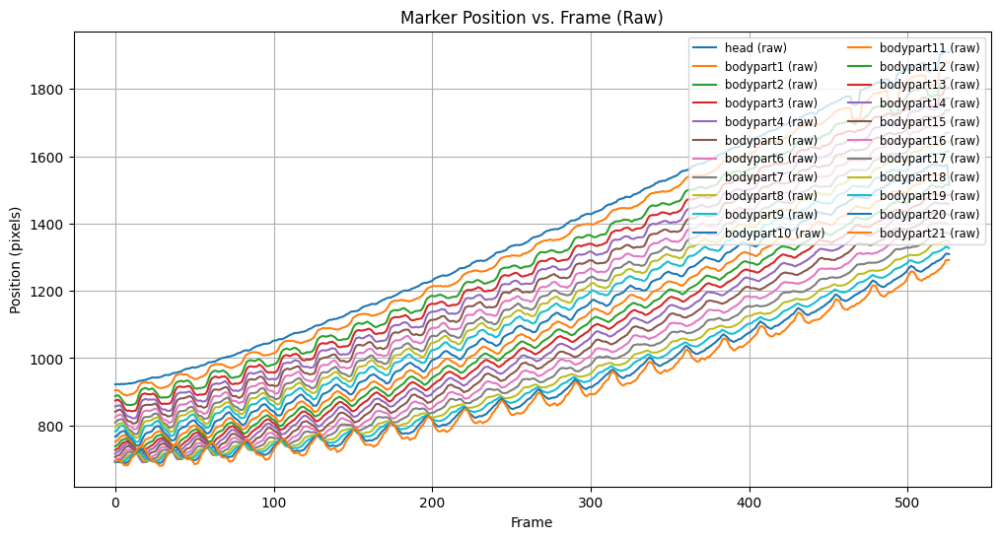

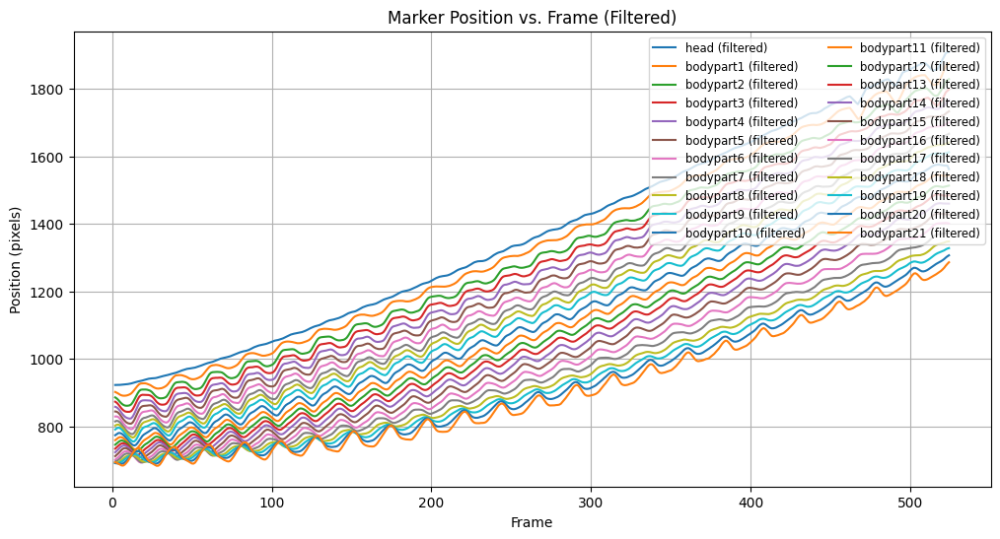

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data with multi-level headers
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
data = pd.read_csv(file_path, header=[1, 2])  # Use rows 2 and 3 as headers

# Extract 'x' and 'y' coordinates
x_coords = data.xs('x', level=1, axis=1)
y_coords = data.xs('y', level=1, axis=1)

# Drop any rows with NaNs to ensure clean data for calculations
x_coords = x_coords.dropna()
y_coords = y_coords.dropna()

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Calculate the Euclidean position of each marker at each frame (raw and filtered)
position_raw = np.sqrt(x_coords**2 + y_coords**2)
position_filtered = smooth_data(position_raw, window_size=5)

# Define a time variable in terms of frames
frames = np.arange(len(position_raw))

# Plot raw positions vs. frames for all markers
plt.figure(figsize=(12, 6))
for marker in position_raw.columns:
    plt.plot(frames, position_raw[marker], label=f'{marker} (raw)')
plt.xlabel('Frame')
plt.ylabel('Position (pixels)')
plt.title('Marker Position vs. Frame (Raw)')
plt.legend(loc='upper right', ncol=2, fontsize='small')
plt.grid(True)
plt.show()

# Plot filtered positions vs. frames for all markers
plt.figure(figsize=(12, 6))
for marker in position_filtered.columns:
    plt.plot(frames, position_filtered[marker], label=f'{marker} (filtered)')
plt.xlabel('Frame')
plt.ylabel('Position (pixels)')
plt.title('Marker Position vs. Frame (Filtered)')
plt.legend(loc='upper right', ncol=2, fontsize='small')
plt.grid(True)
plt.show()


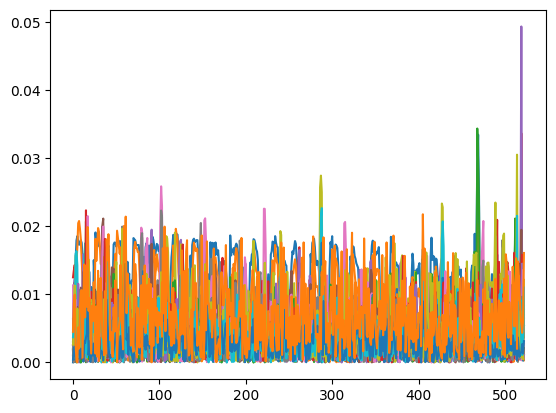

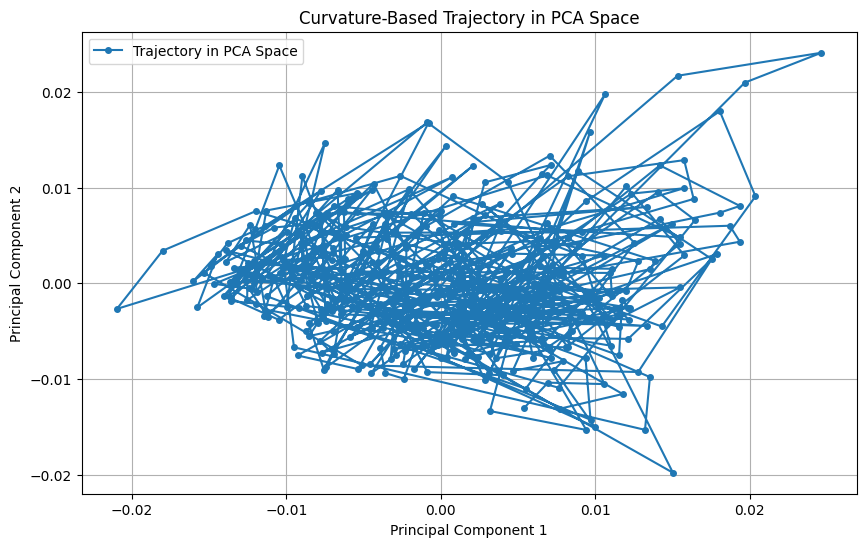

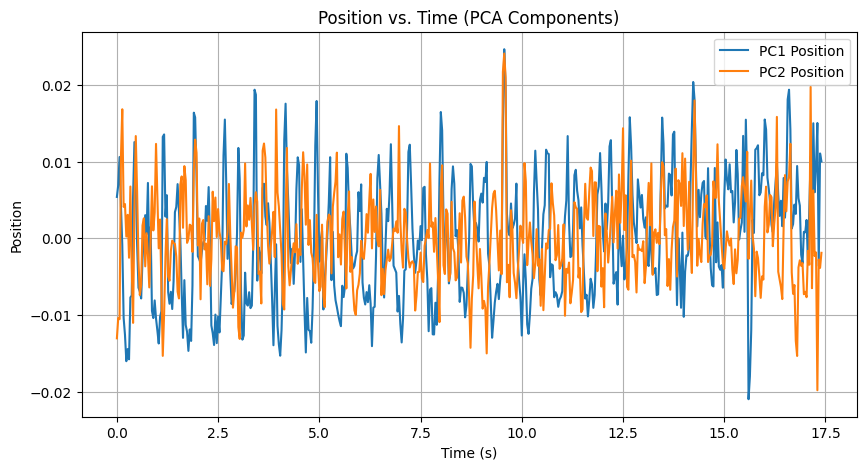

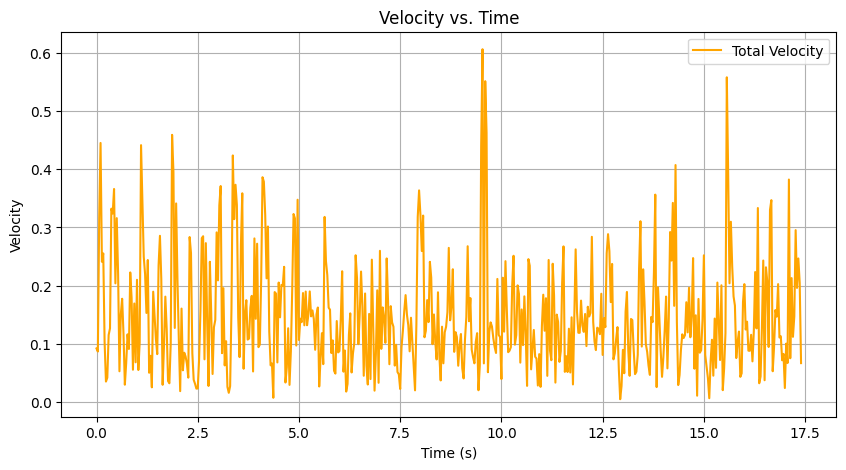

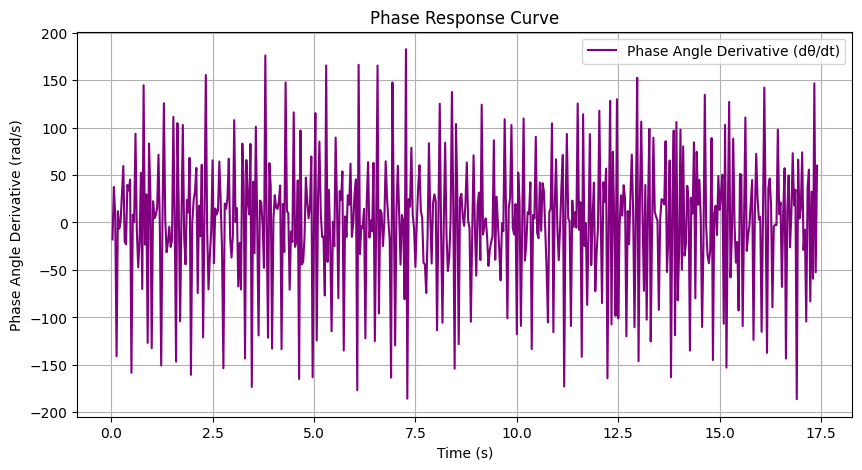

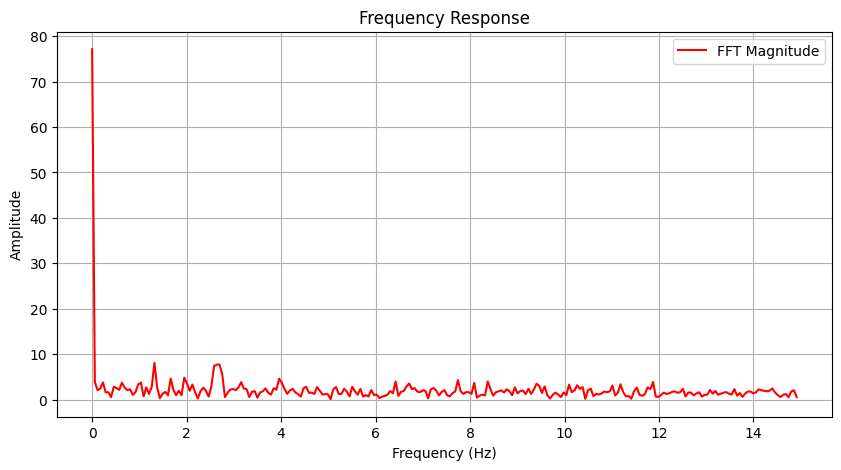

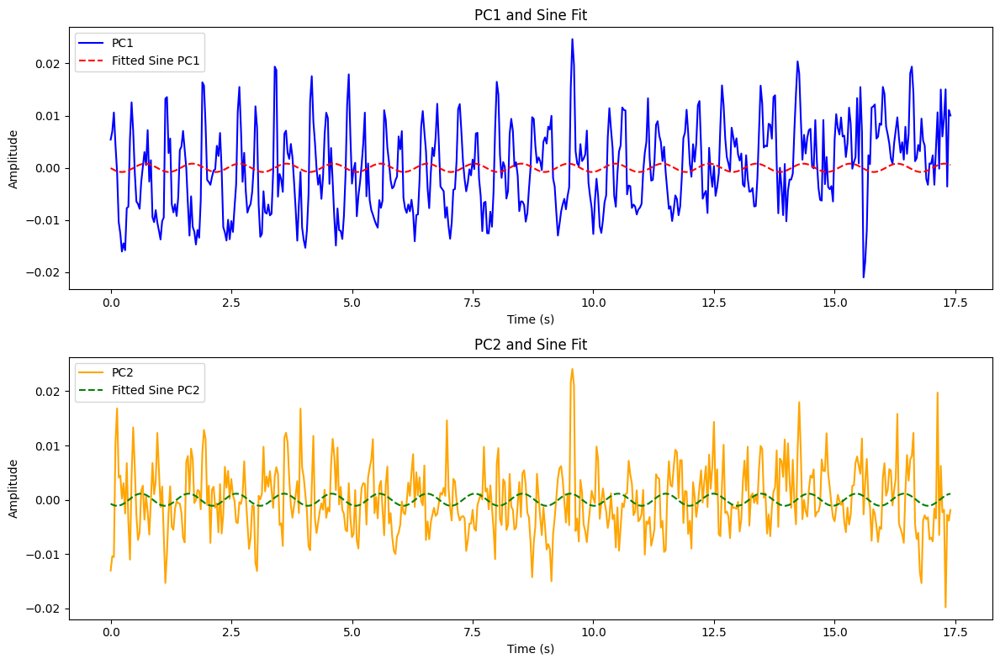

(523, 22)


In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
from sklearn.decomposition import PCA
from scipy.optimize import curve_fit
from scipy.fft import fft, fftfreq

# Load the data with multi-level headers
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
data = pd.read_csv(file_path, header=[1, 2])  # Use rows 2 and 3 as headers

# Extract 'x' and 'y' coordinates
x_coords = data.xs('x', level=1, axis=1).dropna()
y_coords = data.xs('y', level=1, axis=1).dropna()

# Smoothing function
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Apply smoothing to position data
position_raw = np.sqrt(x_coords**2 + y_coords**2)
position_filtered = smooth_data(position_raw, window_size=5).dropna()

# Function to calculate curvature
def calculate_b_spline_curvature(x, y):
    try:
        tck, u = splprep([x, y], s=0, k=3)
        dx, dy = splev(u, tck, der=1)
        ddx, ddy = splev(u, tck, der=2)
        curvature = np.abs(dx * ddy - dy * ddx) / (dx**2 + dy**2)**1.5
        return curvature
    except:
        return np.full(len(x), np.nan)

# Calculate curvature for each frame using filtered positions
curvatures = np.array([calculate_b_spline_curvature(x_coords.iloc[i].values, y_coords.iloc[i].values) for i in range(len(position_filtered))])

# Filter out NaNs in curvatures to proceed with PCA
curvatures = curvatures[~np.isnan(curvatures).any(axis=1)]
plt.plot(curvatures)
# Apply PCA on the curvatures
pca = PCA(n_components=2)
curvature_pca = pca.fit_transform(curvatures)

# Plot Trajectory in PCA Space
plt.figure(figsize=(10, 6))
plt.plot(curvature_pca[:, 0], curvature_pca[:, 1], marker='o', markersize=4, label='Trajectory in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Curvature-Based Trajectory in PCA Space')
plt.grid(True)
plt.legend()
plt.show()

# Generate Time Variable and Perform Additional Plots
frame_rate = 30
time = np.arange(len(curvature_pca)) / frame_rate

# Position vs. Time (PC1 and PC2)
plt.figure(figsize=(10, 5))
plt.plot(time, curvature_pca[:, 0], label='PC1 Position')
plt.plot(time, curvature_pca[:, 1], label='PC2 Position')
plt.xlabel('Time (s)')
plt.ylabel('Position')
plt.title('Position vs. Time (PCA Components)')
plt.legend()
plt.grid(True)
plt.show()

# Velocity vs. Time
velocity_pc1 = np.gradient(curvature_pca[:, 0], time)
velocity_pc2 = np.gradient(curvature_pca[:, 1], time)
total_velocity = np.sqrt(velocity_pc1**2 + velocity_pc2**2)

plt.figure(figsize=(10, 5))
plt.plot(time, total_velocity, label='Total Velocity', color='orange')
plt.xlabel('Time (s)')
plt.ylabel('Velocity')
plt.title('Velocity vs. Time')
plt.legend()
plt.grid(True)
plt.show()

# Phase Response Curve
phase_angle = np.arctan2(velocity_pc2, velocity_pc1)
phase_angle_diff = np.diff(phase_angle) * frame_rate

plt.figure(figsize=(10, 5))
plt.plot(time[1:], phase_angle_diff, label='Phase Angle Derivative (dθ/dt)', color='purple')
plt.xlabel('Time (s)')
plt.ylabel('Phase Angle Derivative (rad/s)')
plt.title('Phase Response Curve')
plt.legend()
plt.grid(True)
plt.show()

# Frequency Response (FFT)
n = len(total_velocity)
freq = fftfreq(n, d=1/frame_rate)
fft_values = fft(total_velocity)
fft_magnitude = np.abs(fft_values[:n // 2])

plt.figure(figsize=(10, 5))
plt.plot(freq[:n // 2], fft_magnitude, label='FFT Magnitude', color='red')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Frequency Response')
plt.legend()
plt.grid(True)
plt.show()

# Sine Wave Fit for PCs
def sine_wave(x, A, B, C, D):
    return A * np.sin(B * x + C) + D

params_pc1, _ = curve_fit(sine_wave, time, curvature_pca[:, 0], p0=[1, 2*np.pi, 0, 0])
params_pc2, _ = curve_fit(sine_wave, time, curvature_pca[:, 1], p0=[1, 2*np.pi, 0, 0])
fitted_pc1 = sine_wave(time, *params_pc1)
fitted_pc2 = sine_wave(time, *params_pc2)

# Plot fitted sine wave
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.plot(time, curvature_pca[:, 0], label='PC1', color='blue')
plt.plot(time, fitted_pc1, '--', label='Fitted Sine PC1', color='red')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('PC1 and Sine Fit')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(time, curvature_pca[:, 1], label='PC2', color='orange')
plt.plot(time, fitted_pc2, '--', label='Fitted Sine PC2', color='green')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('PC2 and Sine Fit')
plt.legend()

plt.tight_layout()
plt.show()

print(curvatures.shape)


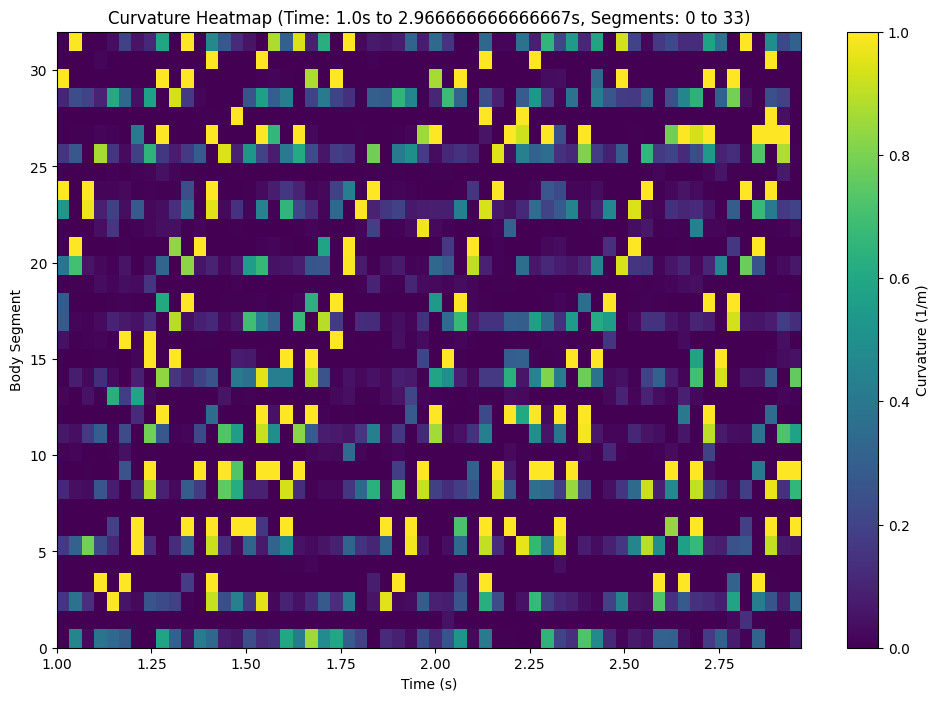

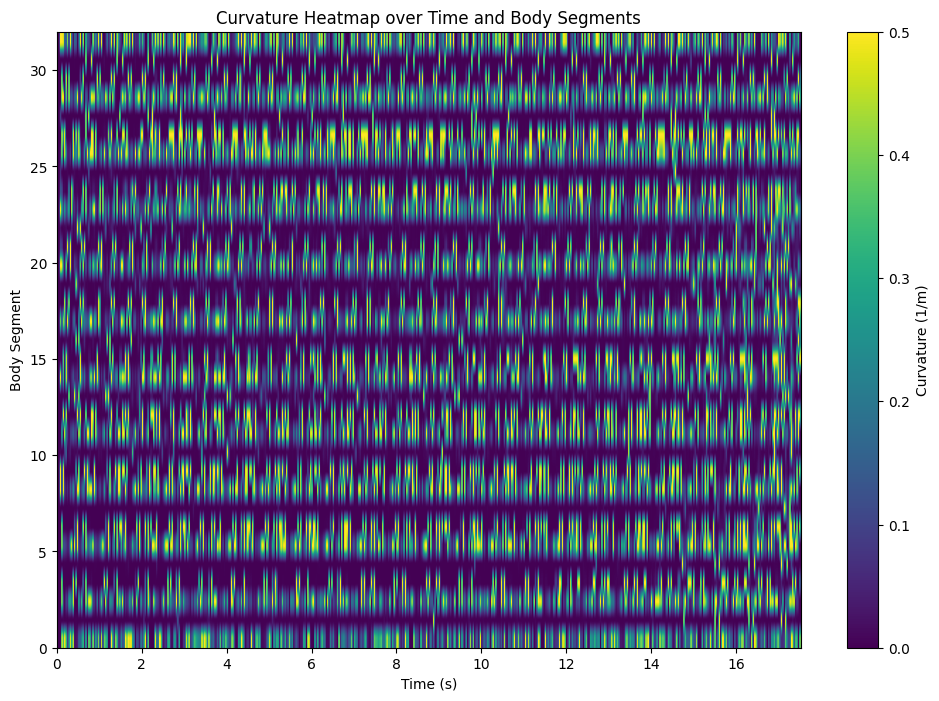

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


# Set your file path and parameters
file_path = '/Users/jamesxu/Downloads/test_40cm/40cm_run3DLC_resnet50_40cm_newOct1shuffle1_100000_filtered.csv'
analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=1, time_window=(1,3), segment_range=(0, 35))



# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords, max_curvature=100):  # Set a max curvature cap
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            # Cap the curvature to avoid outliers
            curvatures.append(min(curvature, max_curvature))
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to plot curvature heatmap over time and body segments
def plot_curvature_heatmap(curvatures, fps=30):
    time = np.arange(curvatures.shape[0]) / fps
    body_segments = np.arange(curvatures.shape[1])

    # Create the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(curvatures.T, aspect='auto', cmap='viridis', origin='lower', extent=[time.min(), time.max(), body_segments.min(), body_segments.max()])
    cbar = plt.colorbar()
    cbar.set_label('Curvature (1/m)')
    plt.xlabel('Time (s)')
    plt.ylabel('Body Segment')
    plt.title('Curvature Heatmap over Time and Body Segments')
    plt.show()

# Function to process data and plot the heatmap
def analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=0.5):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords, max_curvature=max_curvature)
    
    # Plot the curvature heatmap
    plot_curvature_heatmap(curvatures, fps=fps)

# Run the function with your file

analyze_and_plot_curvature_heatmap(file_path)


# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords, max_curvature=100):
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            # Cap the curvature to avoid outliers
            curvatures.append(min(curvature, max_curvature))
        all_curvatures.append(curvatures)
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    return curvatures_array

# Function to plot curvature heatmap over specified time and body segment range
def plot_curvature_heatmap(curvatures, fps=30, time_window=None, segment_range=None):
    total_time = len(curvatures) / fps
    total_segments = curvatures.shape[1]
    
    # Determine the time range for plotting
    if time_window:
        start_time, end_time = time_window
        start_index = int(start_time * fps)
        end_index = int(end_time * fps)
    else:
        start_index, end_index = 0, curvatures.shape[0]

    # Ensure indices are within valid range
    start_index = max(0, start_index)
    end_index = min(curvatures.shape[0], end_index)

    # Determine the segment range for plotting
    if segment_range:
        start_segment, end_segment = segment_range
    else:
        start_segment, end_segment = 0, total_segments
    
    # Ensure segment indices are within valid range
    start_segment = max(0, start_segment)
    end_segment = min(total_segments, end_segment)

    # Extract the subset for the time and segment range
    selected_curvatures = curvatures[start_index:end_index, start_segment:end_segment]
    time = np.arange(start_index, end_index) / fps
    segments = np.arange(start_segment, end_segment)

    # Create the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(selected_curvatures.T, aspect='auto', cmap='viridis', origin='lower',
               extent=[time.min(), time.max(), segments.min(), segments.max()])
    cbar = plt.colorbar()
    cbar.set_label('Curvature (1/m)')
    plt.xlabel('Time (s)')
    plt.ylabel('Body Segment')
    plt.title(f'Curvature Heatmap (Time: {time.min()}s to {time.max()}s, Segments: {start_segment} to {end_segment})')
    plt.show()

# Function to process data and plot the heatmap
def analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=1, time_window=None, segment_range=None):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords, max_curvature=max_curvature)
    
    # Plot the curvature heatmap with specified time and segment range
    plot_curvature_heatmap(curvatures, fps=fps, time_window=time_window, segment_range=segment_range)



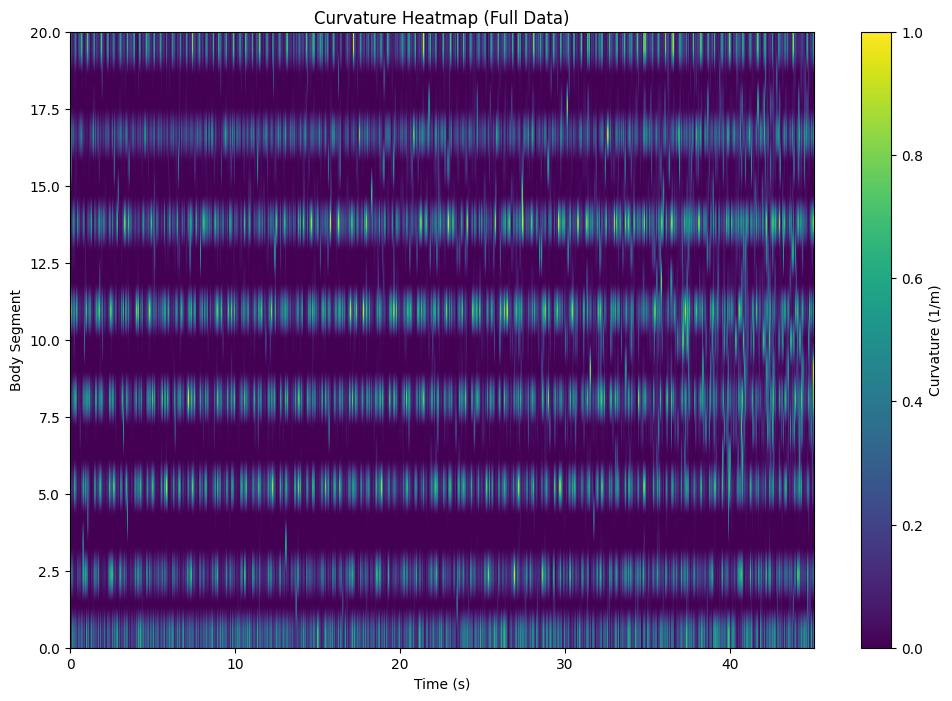

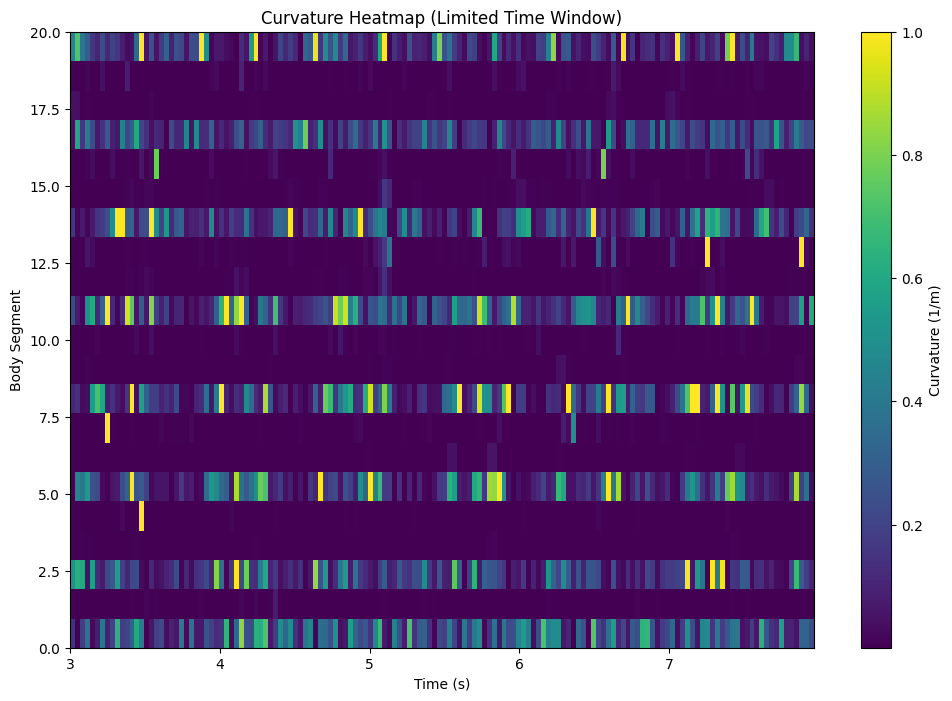

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate curvature across the body for each frame
def calculate_curvatures(x_coords, y_coords, max_curvature=1.0):
    num_segments = min(x_coords.shape[1], y_coords.shape[1])
    all_curvatures = []
    
    for j in range(num_segments):  # Iterate over valid body segments
        curvatures = []
        for i in range(1, len(x_coords) - 1):  # Avoid first and last points
            x1, x2, x3 = x_coords.iloc[i-1, j], x_coords.iloc[i, j], x_coords.iloc[i+1, j]
            y1, y2, y3 = y_coords.iloc[i-1, j], y_coords.iloc[i, j], y_coords.iloc[i+1, j]
            
            # Calculate curvature
            numerator = np.abs((x2 - x1) * (y3 - y1) - (y2 - y1) * (x3 - x1))
            denominator = np.sqrt(((x2 - x1)**2 + (y2 - y1)**2) * ((x3 - x1)**2 + (y3 - y2)**2))
            curvature = numerator / (denominator + 1e-9) if denominator > 0 else 0
            
            # Cap the curvature to avoid outliers
            curvatures.append(min(curvature, max_curvature))
        
        all_curvatures.append(curvatures)
    
    # Convert to numpy array and handle NaN values
    curvatures_array = np.array(all_curvatures).T
    curvatures_array = np.nan_to_num(curvatures_array, nan=0.0)
    
    return curvatures_array

# Function to plot curvature heatmap over specified time and body segment range
def plot_curvature_heatmap(curvatures, fps=30, time_window=None, segment_range=None, title_suffix=""):
    total_time = len(curvatures) / fps
    total_segments = curvatures.shape[1]
    
    # Determine the time range for plotting
    start_index = int(time_window[0] * fps) if time_window else 0
    end_index = int(time_window[1] * fps) if time_window else curvatures.shape[0]
    start_index, end_index = max(0, start_index), min(curvatures.shape[0], end_index)

    # Determine the segment range for plotting
    start_segment = segment_range[0] if segment_range else 0
    end_segment = segment_range[1] if segment_range else total_segments
    start_segment, end_segment = max(0, start_segment), min(total_segments, end_segment)

    # Extract the subset for the time and segment range
    selected_curvatures = curvatures[start_index:end_index, start_segment:end_segment]
    time = np.arange(start_index, end_index) / fps
    segments = np.arange(start_segment, end_segment)

    # Create the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(selected_curvatures.T, aspect='auto', cmap='viridis', origin='lower',
               extent=[time.min(), time.max(), segments.min(), segments.max()])
    cbar = plt.colorbar()
    cbar.set_label('Curvature (1/m)')
    plt.xlabel('Time (s)')
    plt.ylabel('Body Segment')
    plt.title(f'Curvature Heatmap {title_suffix}')
    plt.show()

# Function to process data and plot both the full and limited heatmaps
def analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=1.0, time_window=None, segment_range=None):
    # Load CSV file
    df = pd.read_csv(file_path)
    x_coords = df.iloc[:, ::2].apply(pd.to_numeric, errors='coerce')
    y_coords = df.iloc[:, 1::2].apply(pd.to_numeric, errors='coerce')
    
    # Calculate curvature for each frame across the body
    curvatures = calculate_curvatures(x_coords, y_coords, max_curvature=max_curvature)
    
    # Plot the full data heatmap
    plot_curvature_heatmap(curvatures, fps=fps, title_suffix="(Full Data)")
    
    # Plot the heatmap with specified time and segment range
    plot_curvature_heatmap(curvatures, fps=fps, time_window=time_window, segment_range=segment_range, title_suffix="(Limited Time Window)")

# Set your file path and parameters
file_path = '/Users/jamesxu/Downloads/diffLength_data/24cm_new-James-2024-10-02/videos/24cm_run10DLC_resnet50_24cm_newOct2shuffle1_100000.csv'
analyze_and_plot_curvature_heatmap(file_path, fps=30, max_curvature=1, time_window=(3, 8), segment_range=(0, 33))


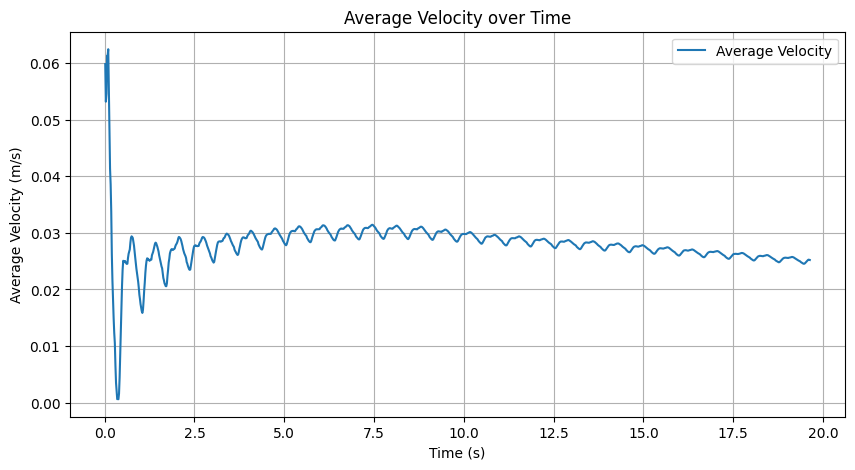

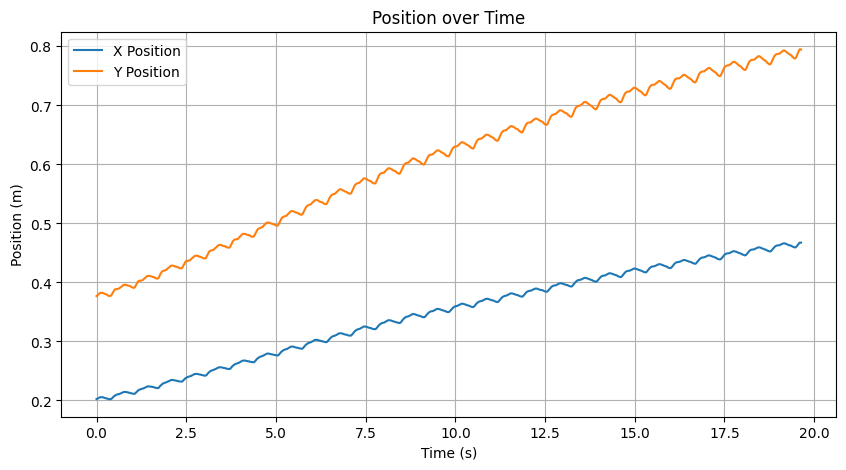

In [149]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to process the data and perform plotting
def analyze_and_plot(file_path, x_length_meters=0.5625, y_length_meters=1, fps=60):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers, skipping the first two rows
    coordinates_df = df.iloc[2:, :44].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate mean position over markers
    mean_x_position = x_coords.mean(axis=1).values
    mean_y_position = y_coords.mean(axis=1).values

    # Time array
    time = np.arange(len(mean_x_position)) / fps

    # Calculate displacement from initial position
    displacement_x = mean_x_position - mean_x_position[0]
    displacement_y = mean_y_position - mean_y_position[0]
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2)

    # Calculate average velocity over time
    # Avoid division by zero at t=0 by starting from index 1
    average_velocity = total_displacement[1:] / time[1:]

    # Plot average velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time[1:], average_velocity, label='Average Velocity')
    plt.xlabel('Time (s)')
    plt.ylabel('Average Velocity (m/s)')
    plt.title('Average Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot position over time (Optional)
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position, label='X Position')
    plt.plot(time, mean_y_position, label='Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/diffLength_data/16cm_new-James-2024-10-03/videos/16cm_run8DLC_resnet50_16cm_newOct3shuffle1_100000_filtered.csv'

# Run the function
analyze_and_plot(file_path)


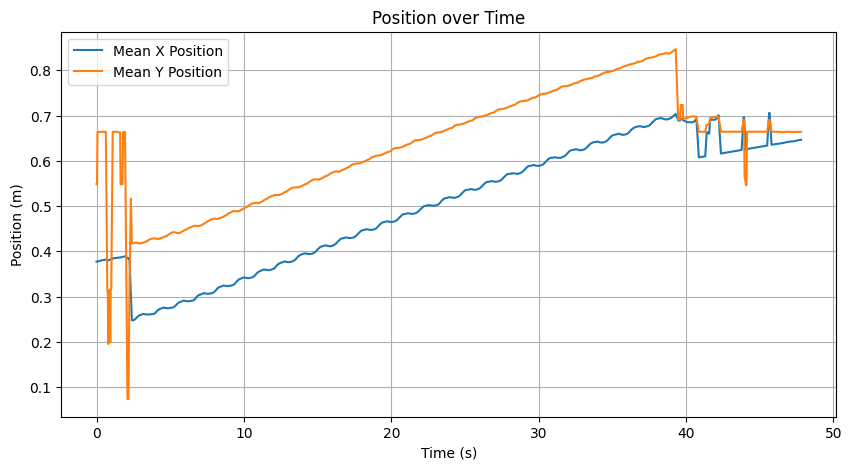

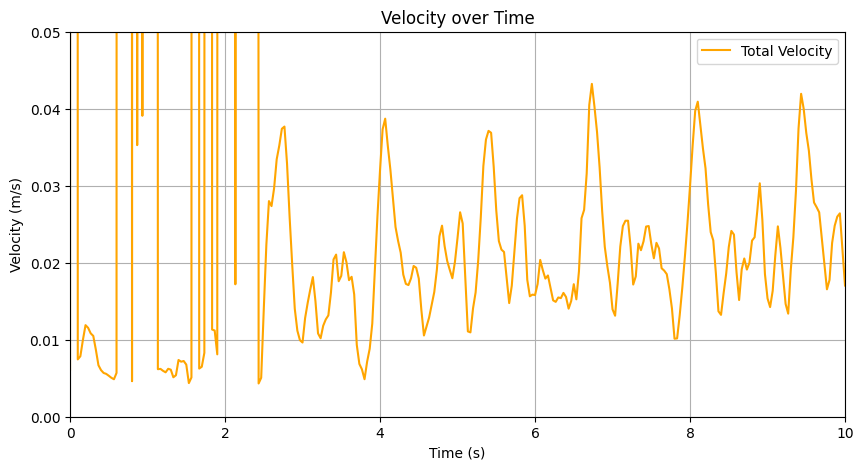

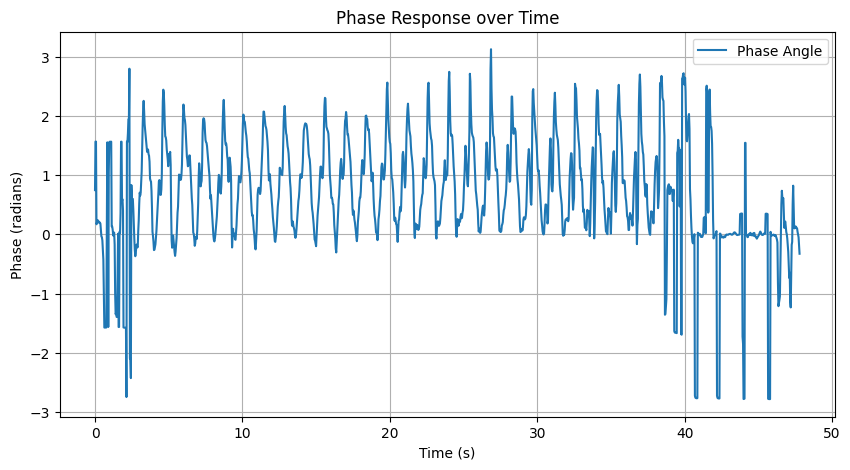

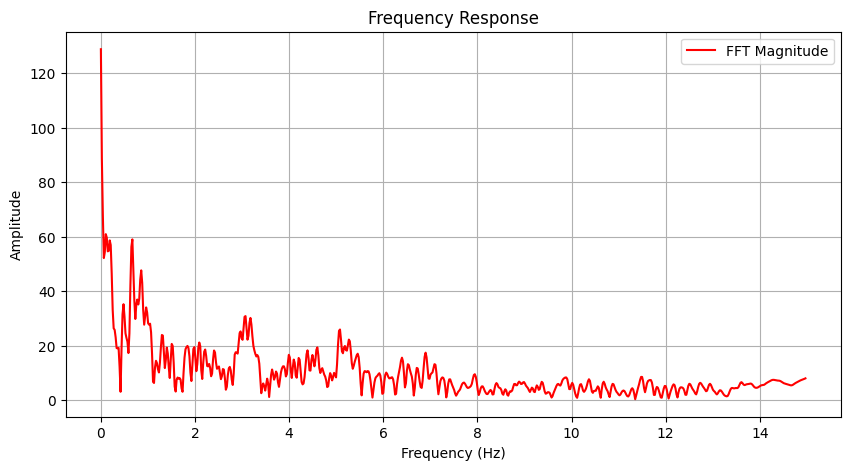

In [166]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
from scipy.fft import fft, fftfreq

# Function to calculate curvature from B-spline derivatives for specified markers
def calculate_b_spline_curvature_for_markers(marker_x, marker_y):
    tck, u = splprep([marker_x, marker_y], s=0, k=3)
    x_prime, y_prime = splev(u, tck, der=1)
    x_double_prime, y_double_prime = splev(u, tck, der=2)
    numerator = np.abs(x_prime * y_double_prime - y_prime * x_double_prime)
    denominator = (x_prime**2 + y_prime**2)**1.5
    curvature = numerator / denominator
    return curvature

# Function to smooth data using a rolling average
def smooth_data(data, window_size=5):
    return data.rolling(window=window_size, center=True).mean()

# Function to process the data and perform analysis
def analyze_and_plot_with_specific_marker_curvature(file_path, x_length_meters=0.5625, y_length_meters=1, fps=30):
    df = pd.read_csv(file_path)
    
    # Normalization factors (Adjust as per dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels
    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract and normalize specific markers
    marker1_x = df.iloc[2:, 0].astype(float) * normalization_factor_x
    marker1_y = df.iloc[2:, 1].astype(float) * normalization_factor_y
    marker2_x = df.iloc[2:, 2].astype(float) * normalization_factor_x
    marker2_y = df.iloc[2:, 3].astype(float) * normalization_factor_y
    marker3_x = df.iloc[2:, 4].astype(float) * normalization_factor_x
    marker3_y = df.iloc[2:, 5].astype(float) * normalization_factor_y

    # Mean position and smoothing
    mean_x_position = smooth_data((marker1_x + marker2_x + marker3_x) / 3)
    mean_y_position = smooth_data((marker1_y + marker2_y + marker3_y) / 3)
    
    # Velocity calculation
    velocity_x = np.gradient(mean_x_position.dropna()) * fps
    velocity_y = np.gradient(mean_y_position.dropna()) * fps
    total_velocity = np.sqrt(velocity_x**2 + velocity_y**2)

    # Curvature calculation
    curvature = calculate_b_spline_curvature_for_markers(mean_x_position.dropna(), mean_y_position.dropna())
    
    # Phase response calculation
    phase = np.arctan2(velocity_y, velocity_x)
    
    # Fourier transform for frequency response
    n = len(total_velocity)
    freq = fftfreq(n, d=1/fps)
    fft_values = fft(total_velocity)
    fft_magnitude = np.abs(fft_values[:n // 2])  # Positive frequencies only
    freq = freq[:n // 2]

    # Time arrays
    time = np.arange(len(mean_x_position.dropna())) / fps

    # Plotting

    # Position over time
    plt.figure(figsize=(10, 5))
    plt.plot(time, mean_x_position.dropna(), label='Mean X Position')
    plt.plot(time, mean_y_position.dropna(), label='Mean Y Position')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Velocity over time
    plt.figure(figsize=(10, 5))
    plt.plot(time, total_velocity, label='Total Velocity', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Velocity over Time')
    plt.legend()
    plt.grid(True)
    plt.xlim(0,10)
    plt.ylim(0,0.05)
    plt.show()

    # Phase response curve
    plt.figure(figsize=(10, 5))
    plt.plot(time, phase, label='Phase Angle')
    plt.xlabel('Time (s)')
    plt.ylabel('Phase (radians)')
    plt.title('Phase Response over Time')
    plt.legend()
    plt.grid(True)
 
    plt.show()


    # Frequency response
    plt.figure(figsize=(10, 5))
    plt.plot(freq, fft_magnitude, label='FFT Magnitude', color='red')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude')
    plt.title('Frequency Response')
    plt.legend()
    plt.grid(True)
    plt.show()


# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/diffLength_data/32cm_new-James-2024-10-02/videos/32cm_run8DLC_resnet50_32cm_newOct2shuffle1_100000.csv'

# Run the function
analyze_and_plot_with_specific_marker_curvature(file_path)


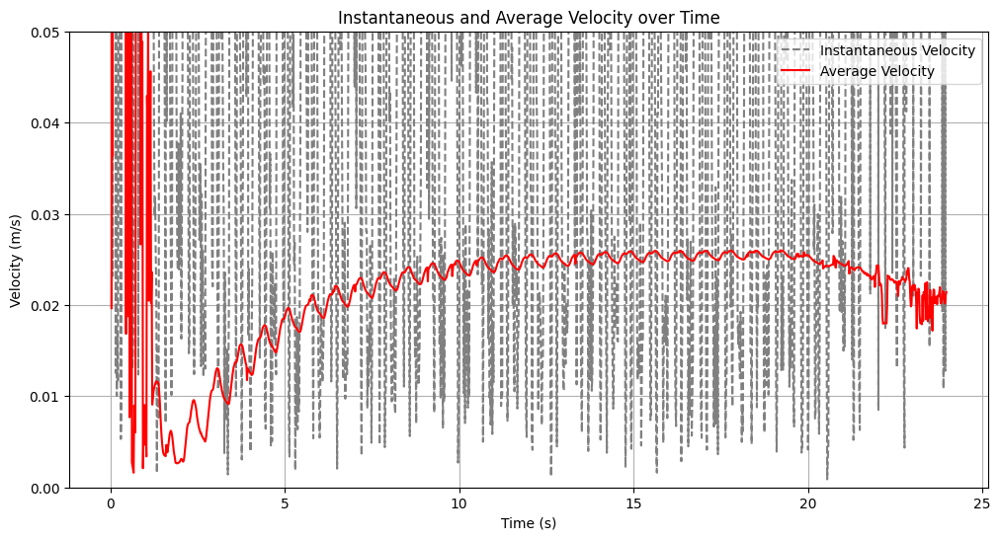

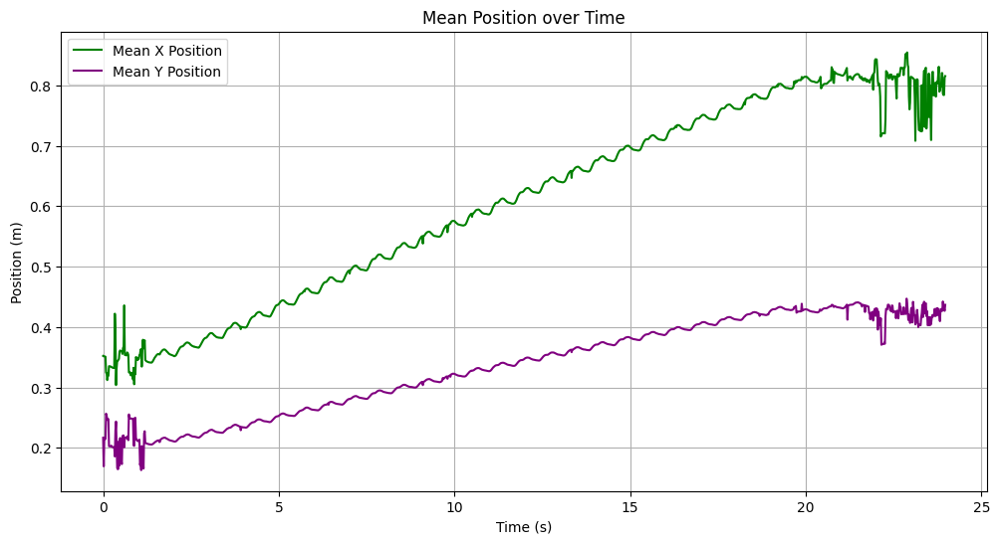

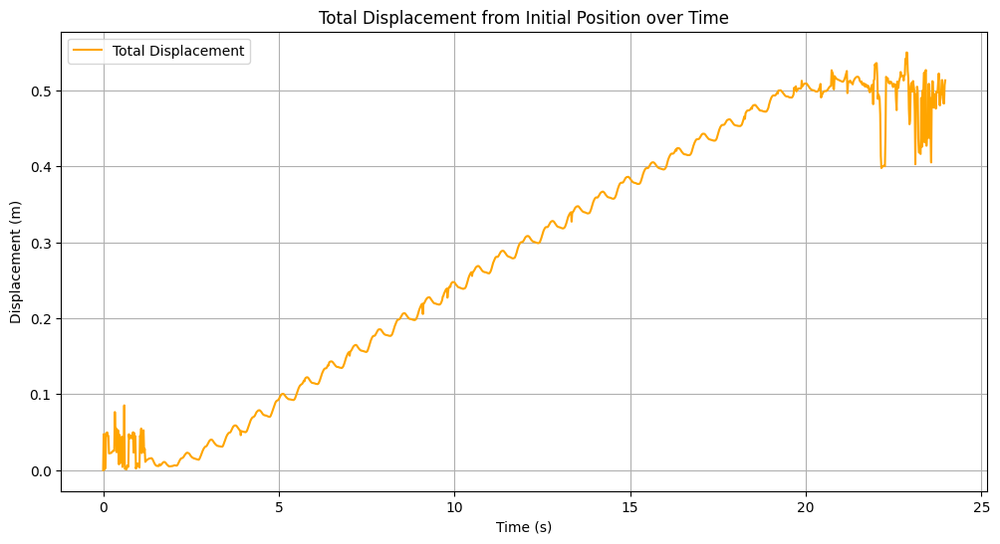

In [175]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to process the data and perform plotting
def analyze_and_plot(file_path, x_length_meters=1, y_length_meters=0.5625, fps=60):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Define normalization factors (Adjust as per your dataset)
    y_length_pixels = pd.to_numeric(df.iloc[2:, 1::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, 1::2].min().min(), errors='coerce')
    normalization_factor_y = y_length_meters / y_length_pixels

    x_length_pixels = pd.to_numeric(df.iloc[2:, ::2].max().max(), errors='coerce') - pd.to_numeric(df.iloc[2:, ::2].min().min(), errors='coerce')
    normalization_factor_x = x_length_meters / x_length_pixels

    # Extract x and y coordinates for the markers, skipping the first two rows
    coordinates_df = df.iloc[2:, :44].apply(pd.to_numeric, errors='coerce')  # Ensure numeric values

    # Separate x and y coordinates and normalize them
    x_coords = coordinates_df.iloc[:, ::2] * normalization_factor_x  # Normalize x-coordinates
    y_coords = coordinates_df.iloc[:, 1::2] * normalization_factor_y  # Normalize y-coordinates

    # Calculate mean position over markers
    mean_x_position = x_coords.mean(axis=1).values
    mean_y_position = y_coords.mean(axis=1).values
    
    # Time array
    time = np.arange(len(mean_x_position)) / fps

    # --- Instantaneous Velocity Calculation ---
    # Calculate differences in position between consecutive frames
    delta_x = np.diff(mean_x_position)
    delta_y = np.diff(mean_y_position)
    
    # Compute instantaneous velocities
    velocity_x = delta_x * fps
    velocity_y = delta_y * fps
    instantaneous_velocity = np.sqrt(velocity_x**2 + velocity_y**2)

    # --- Average Velocity Calculation ---
    # Calculate displacement from initial position at each time point
    displacement_x = mean_x_position - mean_x_position[0]
    displacement_y = mean_y_position - mean_y_position[0]
    total_displacement = np.sqrt(displacement_x**2 + displacement_y**2)
    
    # Avoid division by zero at t=0 by starting from index 1
    average_velocity = total_displacement[1:] / time[1:]

    # Adjust time arrays for plotting
    time_instantaneous = time[1:]  # Since instantaneous velocity is one element shorter due to np.diff

    # --- Plotting Both Velocities ---
    plt.figure(figsize=(12, 6))
    plt.plot(time_instantaneous, instantaneous_velocity, label='Instantaneous Velocity',color='grey',linestyle='--')
    plt.plot(time[1:], average_velocity, label='CoG Average Velocity', color='red' )
    plt.xlabel('Time (s)')
    plt.ylabel('Velocity (m/s)')
    plt.title('Instantaneous and Average Velocity over Time')
    plt.legend()
    # plt.xlim(0,30)
    plt.ylim(0,0.05)
    plt.grid(True)
    plt.show()

    # --- Optional: Plot Position over Time ---
    plt.figure(figsize=(12, 6))
    plt.plot(time, mean_x_position, label='Mean X Position', color='green')
    plt.plot(time, mean_y_position, label='Mean Y Position', color='purple')
    plt.xlabel('Time (s)')
    plt.ylabel('Position (m)')
    plt.title('Mean Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # --- Optional: Plot Displacement over Time ---
    plt.figure(figsize=(12, 6))
    plt.plot(time, total_displacement, label='Total Displacement', color='orange')
    plt.xlabel('Time (s)')
    plt.ylabel('Displacement (m)')
    plt.title('Total Displacement from Initial Position over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

# Path to the CSV file
file_path = '/Users/jamesxu/Downloads/diffLength_data/32cm_new-James-2024-10-02/videos/32cm_run8DLC_resnet50_32cm_newOct2shuffle1_100000.csv'

# Run the function
analyze_and_plot(file_path)
